In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 879.0/879.0 kB 21.6 MB/s eta 0:00:00


In [ ]:
!pip install opencv-python

In [ ]:
!pwd

/content


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls

drive  sample_data


In [ ]:
%cd sample_data

/content/sample_data


In [ ]:
!ls

anscombe.json		     california_housing_train.csv  mnist_train_small.csv
california_housing_test.csv  mnist_test.csv		   README.md


In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/R&D

/content/drive/MyDrive/Colab Notebooks/R&D


In [ ]:
!ls

'3D CNN.ipynb'
'Copy of Detectron2 Tutorial.ipynb'
'Copy of Mask2Former Tutorial.ipynb'
'Copy of YOLACT++.ipynb'
 drone_view.mp4
'HIT Model.ipynb'
 IE643_24M2119_Assigment-1_Q3.ipynb
 IE643_Feed_Forward_Net_Demo_Autumn2024_HW.ipynb
 MaskFreeVIS
 outputs1
 segmented_output.mp4
'Segment Video.ipynb'
'Task-1: Data Pre-processing on UCF Crime Dataset.ipynb'
 Untitled
 video1.mp4
 video2.mp4
 video3.mp4
 video.mp4
 yolov8m-seg.pt
 yolov8n-seg.pt
'yolov8x-seg (1).pt'
 yolov8x-seg.pt


# **Python Code to Extract Frames**

In [ ]:
# Step 2: Import necessary libraries
import cv2
import os

# Step 3: Define paths
video_path = "/content/drive/MyDrive/Colab Notebooks/video1.mp4"  # Provide the path to your video file in Colab
output_dir = "/content/drive/MyDrive/Colab Notebooks/Extracted_Frames"  # Directory to save frames on Google Drive

# Step 4: Create output directory if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Step 5: Load the video using OpenCV
cap = cv2.VideoCapture(video_path)

# Check if the video loaded successfully
if not cap.isOpened():
    print("Error: Could not open video.")
    exit()

# Step 6: Extract every 5th frame and save them to Google Drive
frame_count = 0
saved_frame_count = 0
while True:
    ret, frame = cap.read()

    # If no frame is retrieved (end of video), break the loop
    if not ret:
        break

    # Save only every 5th frame
    if frame_count % 5 == 0:
        frame_name = f"{output_dir}/frame_{saved_frame_count}.jpg"
        cv2.imwrite(frame_name, frame)
        saved_frame_count += 1

    frame_count += 1

# Step 7: Release video capture object
cap.release()
print(f"Saved {saved_frame_count} frames from the video (every 5th frame) to Google Drive at {output_dir}.")


Saved 157 frames from the video (every 5th frame) to Google Drive at /content/drive/MyDrive/Colab Notebooks/Extracted_Frames.


In [ ]:
# Step 1: Upload video from local machine to Colab

from google.colab import files
import shutil
import cv2
from google.colab.patches import cv2_imshow
from ultralytics import YOLO

# # Upload the video file
# uploaded = files.upload()

# # Move the uploaded video to Colab working directory
# video_file = next(iter(uploaded))
# shutil.move(video_file, 'video.mp4')

# Step 2: Load YOLOv8 Segmentation Model and Perform Video Segmentation

# Load YOLOv8 segmentation model
model = YOLO('yolov8n-seg.pt')  # You can use 'yolov8m-seg.pt' or 'yolov8l-seg.pt'

# Function to segment and save the video with YOLOv8
def segment_video(input_video_path, output_video_path):
    # Open the video file
    cap = cv2.VideoCapture(input_video_path)

    # Get video properties
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # Define video writer to save the segmented output
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    # Process video frame by frame
    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Perform segmentation using YOLOv8
        results = model(frame)

        # Render results on the frame (draw masks, bounding boxes, etc.)
        annotated_frame = results[0].plot()

        # Write the annotated frame to the output video
        out.write(annotated_frame)

        # Display the segmented frame in Colab (cv2_imshow for Colab)
        #cv2_imshow(annotated_frame)

        frame_count += 1
        print(f"Processed frame {frame_count}")

        # Option to stop after processing some frames (for debugging)
        # if frame_count > 100:
        #     break

    # Release everything when done
    cap.release()
    out.release()
    print(f"Video saved at {output_video_path}")

# Step 3: Call the function with input and output video paths
input_video = 'drone_view.mp4'  # Path to uploaded video
output_video = './Segmentation_Outputs/segmented_drone_view.mp4'  # Output path to save segmented video

# Perform segmentation and save output video
segment_video(input_video, output_video)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

0: 384x640 (no detections), 69.4ms
Speed: 16.9ms preprocess, 69.4ms inference, 92.3ms postprocess per image at shape (1, 3, 384, 640)
Processed frame 1

0: 384x640 (no detections), 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Processed frame 2

0: 384x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Processed frame 3

0: 384x640 (no detections), 7.9ms
Speed: 2.1ms preprocess, 7.9ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Processed frame 4

0: 384x640 1 train, 8.0ms
Speed: 2.0ms preprocess, 8.0ms inference, 865.0ms postprocess 

# **Getting Just Segmented Video & its Farmes**

In [ ]:
# ## NOTE does it needs to capture all frames, we can capture every 9th frames. -- Reduces Computation Load ##
# ## SWTA -- Sparse Weighted Temporal Attention
# import cv2
# from google.colab.patches import cv2_imshow
# from ultralytics import YOLO
# import numpy as np
# import os

# # Step 2: Load YOLOv8 Segmentation Model

# # Load YOLOv8 segmentation model
# model = YOLO('yolov8x-seg.pt')  # You can use 'yolov8m-seg.pt' or 'yolov8l-seg.pt'

# # Create a directory to store the frames
# os.makedirs("/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/frames1", exist_ok=True)

# # Function to segment video and save person masks
# def segment_and_save_frames(input_video_path, output_video_path):
#     # Open the video file
#     cap = cv2.VideoCapture(input_video_path)

#     # Get video properties
#     width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
#     height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
#     fps = int(cap.get(cv2.CAP_PROP_FPS))

#     # Define video writer to save the segmented output video
#     fourcc = cv2.VideoWriter_fourcc(*'mp4v')
#     out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

#     # Process video frame by frame
#     frame_count = 0                                               ## Using Skip Frames Concept to reduce computation
#     while cap.isOpened():
#         ret, frame = cap.read()
#         if not ret:
#             break
#         count = 0

#         if frame_count % 5 == 0:         # A good balance between reducing load and maintaining a reasonable video quality could be every 5th frame. --------- Imp
#         # Initialize a blank mask image for this frame
#             mask_image = np.zeros_like(frame, dtype=np.float32)  # Use float32 for mask image

#             # Perform segmentation using YOLOv8
#             results = model(frame)

#             # Check if masks and boxes are present in the results
#             if results[0].masks is not None and results[0].boxes is not None:
#                 masks = results[0].masks  # Segmentation masks
#                 boxes = results[0].boxes  # Bounding boxes

#                 # Loop through all detections
#                 for i, (mask, box) in enumerate(zip(masks.data, boxes)):
#                     label = results[0].names[int(box.cls)]  # Get the label of the detected object

#                     # Check if the object is a person
#                     if label == 'person':
#                         # Resize mask to the frame size
#                         mask_resized = cv2.resize(mask.cpu().numpy(), (frame.shape[1], frame.shape[0]))

#                         # Convert mask to binary and multiply with the original frame to extract the person
#                         person_segmented = np.multiply(frame, mask_resized[..., np.newaxis])

#                         # Add this mask to the mask_image for all persons
#                         mask_image += person_segmented

#                         #if frame_count % 5 == 0: # To get full proper video. A good balance between reducing load and maintaining a reasonable video quality could be every 5th frame.
#                         # Save each person's segmented mask as an image (in different folders)
#                         #os.makedirs(f"/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks3/mask_person_{i}", exist_ok=True)
#                         #cv2.imwrite(f"/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks3/mask_person_{i}/frame_{frame_count}_person_{i}.png", person_segmented)

#                 # Clip values to valid range [0, 255] and convert to uint8 for saving
#                 mask_image = np.clip(mask_image, 0, 255).astype(np.uint8)

#                 # Write the annotated frame (with all masks) to the output video
#                 out.write(mask_image)
#                 os.makedirs(f"/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/frames1", exist_ok=True)
#                 cv2.imwrite(f"/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/frames/frame_{count}.png", mask_image)
#                 count = count + 1

#             else:
#                 print(f"No masks detected in frame {frame_count}")

#             # Display the current frame with masks (for debugging)
#             #cv2_imshow(mask_image)

#         frame_count += 1
#         #print(f"Processed frame {frame_count}")

#     # Release everything when done
#     cap.release()
#     out.release()
#     print(f"Video saved at {output_video_path}")
#     print(f"Frames saved in /content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/frames1")

# # Step 3: Set input and output video paths
# input_video = '/content/drive/MyDrive/Colab Notebooks/video1.mp4'  # Change this to your video path
# output_video = '/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/video1.mp4'  # Path to save segmented video

# # Perform segmentation and save person masks
# segment_and_save_frames(input_video, output_video)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

0: 384x640 (no detections), 104.7ms
Speed: 7.1ms preprocess, 104.7ms inference, 112.4ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 0

0: 384x640 (no detections), 55.3ms
Speed: 1.6ms preprocess, 55.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 5

0: 384x640 (no detections), 53.4ms
Speed: 1.4ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 10

0: 384x640 (no detections), 48.0ms
Speed: 2.2ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 15

0: 384x640 (no detections), 48.0ms

# **Improved With Annotation - BB, Object's Class & Segmentation, Action's Label --- For Trainig Phase (Data Preprocessing)**

Recommended Approach for HAR:

Training Phase:

Use labeled data (action classes) to train the model.
Incorporate bounding boxes and object classes to enhance learning.

Testing Phase:

Allow the model to predict actions without predefined action classes.
Utilize features such as bounding boxes and segmentation to provide context, but focus on evaluating the model’s performance based on its predictions.

In [ ]:
## Multiple Action Annotations
import cv2
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import os

# Load YOLOv8 segmentation model
model = YOLO('yolov8x-seg.pt')  # Use 'yolov8m-seg.pt' or 'yolov8l-seg.pt' as needed

# Create a directory to store the frames
output_frame_dir = "/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/frames_with_action"
os.makedirs(output_frame_dir, exist_ok=True)

# Predefined action labels with time intervals (in seconds)
action_times = [
    (0, 5, "Kicking"),       # From 0 to 5 seconds: "Kicking"
    (6, 10, "Punching"),     # From 6 to 10 seconds: "Punching"
    (11, 15, "Knee Strike"), # From 11 to 15 seconds: "Knee Strike"
    (16, 20, "Kicking"),     # From 16 to 20 seconds: "Kicking"
    (21, 25, "Push Hard"),   # From 21 to 25 seconds: "Push Hard"
    (26, 32.62, "Knocked Out")  # From 26 to 32 seconds: "Knocked Out"
]

# Function to get the action label based on the current timestamp
def get_action_label(current_time):
    for start, end, label in action_times:
        if start <= current_time <= end:
            return label
    return " "#"Unknown Action"

# Function to segment video and save frames with bounding boxes, class labels, and action labels
def segment_and_save_frames(input_video_path, output_video_path):
    # Open the video file
    cap = cv2.VideoCapture(input_video_path)

    # Get video properties
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # Define video writer to save the segmented output video
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    # Check if video writer opened successfully
    if not out.isOpened():
        print("Error: VideoWriter failed to open.")
        return

    # Initialize frame count and image save counter
    frame_count = 0
    count = 0  # For saving frames

    # Process video frame by frame
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Calculate current time in seconds
        current_time = frame_count / fps

        #if frame_count % 5 == 0:  # Capture every 5th frame to reduce load       ------------------------------------------------------------
        # Perform segmentation using YOLOv8
        results = model(frame)

        # Check if masks and boxes are present in the results
        if results[0].masks is not None and results[0].boxes is not None:
            masks = results[0].masks  # Segmentation masks
            boxes = results[0].boxes  # Bounding boxes

            # Initialize a blank mask image for this frame
            mask_image = np.zeros_like(frame, dtype=np.float32)

            # Loop through all detections
            for i, (mask, box) in enumerate(zip(masks.data, boxes)):
                label = results[0].names[int(box.cls)]  # Get the label of the detected object

                if label == 'person':

                    # Resize mask to the frame size
                    mask_resized = cv2.resize(mask.cpu().numpy(), (frame.shape[1], frame.shape[0]))

                    # Convert mask to binary
                    mask_binary = (mask_resized > 0).astype(np.uint8)

                    # Extract the segmented person using the binary mask
                    person_segmented = frame * mask_binary[..., np.newaxis]

                    # Overlay the segmented person onto the mask image (keeps the RGB colors)
                    mask_image[mask_binary == 1] = person_segmented[mask_binary == 1]

                    # Draw bounding box
                    #if label == 'person':
                    bbox_xyxy = box.xyxy[0].cpu().numpy().astype(int)  # Convert bounding box to integer
                    cv2.rectangle(mask_image, (bbox_xyxy[0], bbox_xyxy[1]), (bbox_xyxy[2], bbox_xyxy[3]), (0, 255, 0), 2)  # Draw bounding box

                    # Add class label above the bounding box
                    cv2.putText(mask_image, label, (bbox_xyxy[0], bbox_xyxy[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2, cv2.LINE_AA)

            # Get the action label based on the current time
            action_label = get_action_label(current_time)

            # Add action label to the frame (display action for the whole clip)
            #cv2.putText(mask_image, action_label, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 255, 255), 2, cv2.LINE_AA)

            # Clip values to valid range [0, 255] and convert to uint8 for saving
            mask_image = np.clip(mask_image, 0, 255).astype(np.uint8)

            # Write the annotated frame (with all masks and action label) to the output video
            out.write(mask_image)

            # Save the frame as an image
            cv2.imwrite(f"{output_frame_dir}/frame_{count}.png", mask_image)
            count += 1  # Increment count for saved frames

        else:
            print(f"No masks detected in frame {frame_count}")        # ----------------------------------------------------------------------------------

        frame_count += 1

    # Release everything when done
    cap.release()
    out.release()
    print(f"Video saved at {output_video_path}")
    print(f"Frames saved in {output_frame_dir}")

# Set input and output video paths
input_video = '/content/drive/MyDrive/Colab Notebooks/video3.mp4'  # Change this to your video path
output_video = '/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/video1_with_action_intervals.mp4'  # Path to save segmented video

# Perform segmentation and save person masks with action annotations
segment_and_save_frames(input_video, output_video)


0: 384x640 14 persons, 4 cars, 1 bus, 5 traffic lights, 1 handbag, 73.6ms
Speed: 1.5ms preprocess, 73.6ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 persons, 4 cars, 1 bus, 5 traffic lights, 1 handbag, 53.9ms
Speed: 1.8ms preprocess, 53.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 persons, 4 cars, 1 bus, 5 traffic lights, 1 handbag, 49.6ms
Speed: 1.4ms preprocess, 49.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 persons, 4 cars, 1 bus, 4 traffic lights, 1 handbag, 43.2ms
Speed: 1.4ms preprocess, 43.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 persons, 4 cars, 1 bus, 4 traffic lights, 1 handbag, 42.6ms
Speed: 2.0ms preprocess, 42.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 persons, 4 cars, 1 bus, 4 traffic lights, 1 handbag, 43.1ms
Speed: 1.4ms preprocess, 43.1ms inference, 1.9ms postprocess per 

In [ ]:
## Whole Video Annotation
import cv2
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import os

# Load YOLOv8 segmentation model
model = YOLO('yolov8x-seg.pt')  # Use 'yolov8m-seg.pt' or 'yolov8l-seg.pt' as needed

# Create a directory to store the frames
output_frame_dir = "/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/frames1"
os.makedirs(output_frame_dir, exist_ok=True)

# Function to segment video and save frames with bounding boxes, class labels, and action labels
def segment_and_save_frames(input_video_path, output_video_path, action_label="Person Action"):
    # Open the video file
    cap = cv2.VideoCapture(input_video_path)

    # Get video properties
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # Define video writer to save the segmented output video
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    # Check if video writer opened successfully
    if not out.isOpened():
        print("Error: VideoWriter failed to open.")
        return

    # Initialize frame count and image save counter
    frame_count = 0
    count = 0  # For saving frames

    # Process video frame by frame
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % 5 == 0:  # Capture every 5th frame to reduce load
            # Perform segmentation using YOLOv8
            results = model(frame)

            # Check if masks and boxes are present in the results
            if results[0].masks is not None and results[0].boxes is not None:
                masks = results[0].masks  # Segmentation masks
                boxes = results[0].boxes  # Bounding boxes

                # Initialize a blank mask image for this frame
                mask_image = np.zeros_like(frame, dtype=np.float32)

                # Loop through all detections
                for i, (mask, box) in enumerate(zip(masks.data, boxes)):
                    label = results[0].names[int(box.cls)]  # Get the label of the detected object

                    # Resize mask to the frame size
                    mask_resized = cv2.resize(mask.cpu().numpy(), (frame.shape[1], frame.shape[0]))

                    # Convert mask to binary and multiply with the original frame to extract the person
                    person_segmented = np.multiply(frame, mask_resized[..., np.newaxis])

                    # Add this mask to the mask_image
                    mask_image += person_segmented

                    # Draw bounding box
                    bbox_xyxy = box.xyxy[0].cpu().numpy().astype(int)  # Convert bounding box to integer
                    cv2.rectangle(mask_image, (bbox_xyxy[0], bbox_xyxy[1]), (bbox_xyxy[2], bbox_xyxy[3]),
                                  (0, 255, 0), 2)  # Draw bounding box

                    # Add class label above the bounding box
                    cv2.putText(mask_image, label, (bbox_xyxy[0], bbox_xyxy[1] - 10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2, cv2.LINE_AA)

                # Clip values to valid range [0, 255] and convert to uint8 for saving
                mask_image = np.clip(mask_image, 0, 255).astype(np.uint8)

                # Add action label to the frame (if needed)
                cv2.putText(mask_image, action_label, (10, 30),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2, cv2.LINE_AA)

                # Write the annotated frame (with all masks and action label) to the output video
                out.write(mask_image)

                # Save the frame as an image
                cv2.imwrite(f"{output_frame_dir}/frame_{count}.png", mask_image)
                count += 1  # Increment count for saved frames

            else:
                print(f"No masks detected in frame {frame_count}")

        frame_count += 1

    # Release everything when done
    cap.release()
    out.release()
    print(f"Video saved at {output_video_path}")
    print(f"Frames saved in {output_frame_dir}")

# Set input and output video paths
input_video = '/content/drive/MyDrive/Colab Notebooks/video1.mp4'  # Change this to your video path
output_video = '/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/video1.mp4'  # Path to save segmented video

# Perform segmentation and save person masks with action annotations
segment_and_save_frames(input_video, output_video, action_label="Fight")            # --------------------------- Uncomment This -------------------#


0: 384x640 (no detections), 53.2ms
Speed: 1.5ms preprocess, 53.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 0

0: 384x640 (no detections), 52.2ms
Speed: 1.5ms preprocess, 52.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 5

0: 384x640 (no detections), 52.6ms
Speed: 1.9ms preprocess, 52.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 10

0: 384x640 (no detections), 43.1ms
Speed: 2.3ms preprocess, 43.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 15

0: 384x640 (no detections), 44.7ms
Speed: 1.4ms preprocess, 44.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 20

0: 384x640 (no detections), 44.4ms
Speed: 1.4ms preprocess, 44.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 25

0: 384x640 (no detectio

# **Use this only test phase: BB & Segmentation**

In [ ]:
## Proper Output ##
import cv2
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import os

# Load YOLOv8 segmentation model
model = YOLO('yolov8x-seg.pt')  # Use 'yolov8m-seg.pt' or 'yolov8l-seg.pt' as needed

# Create a directory to store the frames
output_frame_dir = "/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/frames_test"
os.makedirs(output_frame_dir, exist_ok=True)

# Function to segment video and save frames with bounding boxes and colorful segmentation
def segment_and_save_frames(input_video_path, output_video_path):
    # Open the video file
    cap = cv2.VideoCapture(input_video_path)

    # Get video properties
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # Define video writer to save the output video
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    # Check if video writer opened successfully
    if not out.isOpened():
        print("Error: VideoWriter failed to open.")
        return

    # Initialize frame count and image save counter
    frame_count = 0
    count = 0  # For saving frames

    # Process video frame by frame
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % 5 == 0:  # Capture every 5th frame to reduce load
            # Perform segmentation using YOLOv8
            results = model(frame)

            # Check if masks and boxes are present in the results
            if results[0].masks is not None and results[0].boxes is not None:
                masks = results[0].masks  # Segmentation masks
                boxes = results[0].boxes  # Bounding boxes

                # Create a black background
                mask_image = np.zeros((height, width, 3), dtype=np.uint8)  # Create a black image

                # Loop through all detections
                for i, (mask, box) in enumerate(zip(masks.data, boxes)):
                    # Resize mask to the frame size
                    mask_resized = cv2.resize(mask.cpu().numpy(), (frame.shape[1], frame.shape[0]))

                    # Convert mask to binary
                    mask_binary = (mask_resized > 0).astype(np.uint8)

                    # Extract the segmented person using the binary mask
                    segmented_person = frame * mask_binary[..., np.newaxis]

                    # Set the masked areas to the black background
                    mask_image[mask_binary == 1] = segmented_person[mask_binary == 1]

                    # Draw bounding box on the mask image
                    bbox_xyxy = box.xyxy[0].cpu().numpy().astype(int)  # Get bounding box coordinates
                    cv2.rectangle(mask_image, (bbox_xyxy[0], bbox_xyxy[1]), (bbox_xyxy[2], bbox_xyxy[3]), (0, 255, 0), 2)

                # Write the masked frame (with colorful segmentation and bounding boxes) to the output video
                out.write(mask_image)

                # Save the frame as an image
                cv2.imwrite(f"{output_frame_dir}/frame_{count}.png", mask_image)
                count += 1  # Increment count for saved frames

            else:
                print(f"No masks detected in frame {frame_count}")

        frame_count += 1

    # Release everything when done
    cap.release()
    out.release()
    print(f"Video saved at {output_video_path}")
    print(f"Frames saved in {output_frame_dir}")

# Set input and output video paths
input_video = '/content/drive/MyDrive/Colab Notebooks/video1.mp4'  # Change this to your video path
output_video = '/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/video1_test.mp4'  # Path to save segmented video

# Perform segmentation and save frames with bounding boxes and colorful masks
segment_and_save_frames(input_video, output_video)



0: 384x640 (no detections), 65.9ms
Speed: 1.4ms preprocess, 65.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 0

0: 384x640 (no detections), 43.2ms
Speed: 1.3ms preprocess, 43.2ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 5

0: 384x640 (no detections), 46.2ms
Speed: 1.2ms preprocess, 46.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 10

0: 384x640 (no detections), 44.6ms
Speed: 1.3ms preprocess, 44.6ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 15

0: 384x640 (no detections), 45.0ms
Speed: 2.1ms preprocess, 45.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 20

0: 384x640 (no detections), 43.3ms
Speed: 2.1ms preprocess, 43.3ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 25

0: 384x640 (no detectio

In [ ]:
# Colourful Segmentation
import cv2
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import os

# Load YOLOv8 segmentation model
model = YOLO('yolov8x-seg.pt')  # Use 'yolov8m-seg.pt' or 'yolov8l-seg.pt' as needed

# Create a directory to store the frames
output_frame_dir = "/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/frames_test"
os.makedirs(output_frame_dir, exist_ok=True)

# Function to segment video and save frames with bounding boxes and colorful segmentation
def segment_and_save_frames(input_video_path, output_video_path):
    # Open the video file
    cap = cv2.VideoCapture(input_video_path)

    # Get video properties
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # Define video writer to save the output video
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    # Check if video writer opened successfully
    if not out.isOpened():
        print("Error: VideoWriter failed to open.")
        return

    # Initialize frame count and image save counter
    frame_count = 0
    count = 0  # For saving frames

    # Process video frame by frame
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % 5 == 0:  # Capture every 5th frame to reduce load
            # Perform segmentation using YOLOv8
            results = model(frame)

            # Check if masks and boxes are present in the results
            if results[0].masks is not None and results[0].boxes is not None:
                masks = results[0].masks  # Segmentation masks
                boxes = results[0].boxes  # Bounding boxes

                # Initialize a black background
                mask_image = np.zeros((height, width, 3), dtype=np.uint8)  # Create a black image

                # Loop through all detections
                for i, (mask, box) in enumerate(zip(masks.data, boxes)):
                    # Resize mask to the frame size
                    mask_resized = cv2.resize(mask.cpu().numpy(), (frame.shape[1], frame.shape[0]))

                    # Convert mask to binary
                    mask_binary = (mask_resized > 0).astype(np.uint8)

                    # Create a colored mask for visualization (random color)
                    random_color = np.random.randint(0, 255, size=(3,), dtype=np.uint8)
                    colored_mask = np.zeros_like(frame)
                    colored_mask[mask_binary == 1] = random_color  # Set random color for the mask

                    # Apply the mask to the black image
                    mask_image[mask_binary == 1] = colored_mask[mask_binary == 1]  # Copy colored mask to black image

                    # Draw bounding box on the black image
                    bbox_xyxy = box.xyxy[0].cpu().numpy().astype(int)  # Get bounding box coordinates
                    cv2.rectangle(mask_image, (bbox_xyxy[0], bbox_xyxy[1]), (bbox_xyxy[2], bbox_xyxy[3]), (0, 255, 0), 2)

                # Write the masked frame (with colorful segmentation and bounding boxes) to the output video
                out.write(mask_image)

                # Save the frame as an image
                cv2.imwrite(f"{output_frame_dir}/frame_{count}.png", mask_image)
                count += 1  # Increment count for saved frames

            else:
                print(f"No masks detected in frame {frame_count}")

        frame_count += 1

    # Release everything when done
    cap.release()
    out.release()
    print(f"Video saved at {output_video_path}")
    print(f"Frames saved in {output_frame_dir}")

# Set input and output video paths
input_video = '/content/drive/MyDrive/Colab Notebooks/video1.mp4'  # Change this to your video path
output_video = '/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/video1_test.mp4'  # Path to save segmented video

# Perform segmentation and save frames with bounding boxes and colorful masks
segment_and_save_frames(input_video, output_video)


0: 384x640 (no detections), 62.2ms
Speed: 1.4ms preprocess, 62.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 0

0: 384x640 (no detections), 45.3ms
Speed: 1.6ms preprocess, 45.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 5

0: 384x640 (no detections), 45.3ms
Speed: 2.4ms preprocess, 45.3ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 10

0: 384x640 (no detections), 45.2ms
Speed: 1.3ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 15

0: 384x640 (no detections), 44.3ms
Speed: 1.8ms preprocess, 44.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 20

0: 384x640 (no detections), 44.6ms
Speed: 2.3ms preprocess, 44.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 25

0: 384x640 (no detectio

In [ ]:
# ## Segemtation
# import cv2
# from google.colab.patches import cv2_imshow
# from ultralytics import YOLO
# import numpy as np
# import os

# # Load YOLOv8 segmentation model
# model = YOLO('yolov8x-seg.pt')  # Use 'yolov8m-seg.pt' or 'yolov8l-seg.pt' as needed

# # Create a directory to store the frames
# output_frame_dir = "/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/frames_test"
# os.makedirs(output_frame_dir, exist_ok=True)

# # Function to segment video and save frames with bounding boxes and segmentation
# def segment_and_save_frames(input_video_path, output_video_path):
#     # Open the video file
#     cap = cv2.VideoCapture(input_video_path)

#     # Get video properties
#     width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
#     height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
#     fps = int(cap.get(cv2.CAP_PROP_FPS))

#     # Define video writer to save the output video
#     fourcc = cv2.VideoWriter_fourcc(*'mp4v')
#     out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

#     # Check if video writer opened successfully
#     if not out.isOpened():
#         print("Error: VideoWriter failed to open.")
#         return

#     # Initialize frame count and image save counter
#     frame_count = 0
#     count = 0  # For saving frames

#     # Process video frame by frame
#     while cap.isOpened():
#         ret, frame = cap.read()
#         if not ret:
#             break

#         if frame_count % 5 == 0:  # Capture every 5th frame to reduce load
#             # Perform segmentation using YOLOv8
#             results = model(frame)

#             # Check if masks and boxes are present in the results
#             if results[0].masks is not None and results[0].boxes is not None:
#                 masks = results[0].masks  # Segmentation masks
#                 boxes = results[0].boxes  # Bounding boxes

#                 # Initialize a black background
#                 mask_image = np.zeros_like(frame)  # Create a black image

#                 # Loop through all detections
#                 for i, (mask, box) in enumerate(zip(masks.data, boxes)):
#                     # Resize mask to the frame size
#                     mask_resized = cv2.resize(mask.cpu().numpy(), (frame.shape[1], frame.shape[0]))

#                     # Convert mask to binary
#                     mask_binary = (mask_resized > 0).astype(np.uint8)

#                     # Create a colored mask for visualization (green color)
#                     colored_mask = np.zeros_like(frame)
#                     colored_mask[mask_binary == 1] = (0, 255, 0)  # Set green color for the mask

#                     # Apply the mask to the black image
#                     mask_image[mask_binary == 1] = colored_mask[mask_binary == 1]  # Copy colored mask to black image

#                     # Draw bounding box on the black image
#                     bbox_xyxy = box.xyxy[0].cpu().numpy().astype(int)  # Get bounding box coordinates
#                     cv2.rectangle(mask_image, (bbox_xyxy[0], bbox_xyxy[1]), (bbox_xyxy[2], bbox_xyxy[3]), (0, 255, 0), 2)

#                 # Write the masked frame (with segmentation and bounding boxes) to the output video
#                 out.write(mask_image)

#                 # Save the frame as an image
#                 cv2.imwrite(f"{output_frame_dir}/frame_{count}.png", mask_image)
#                 count += 1  # Increment count for saved frames

#             else:
#                 print(f"No masks detected in frame {frame_count}")

#         frame_count += 1

#     # Release everything when done
#     cap.release()
#     out.release()
#     print(f"Video saved at {output_video_path}")
#     print(f"Frames saved in {output_frame_dir}")

# # Set input and output video paths
# input_video = '/content/drive/MyDrive/Colab Notebooks/video1.mp4'  # Change this to your video path
# output_video = '/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/video1_test.mp4'  # Path to save segmented video

# # Perform segmentation and save frames with bounding boxes and masks
# segment_and_save_frames(input_video, output_video)



0: 384x640 (no detections), 76.7ms
Speed: 1.4ms preprocess, 76.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 0

0: 384x640 (no detections), 47.3ms
Speed: 1.2ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 5

0: 384x640 (no detections), 43.1ms
Speed: 2.0ms preprocess, 43.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 10

0: 384x640 (no detections), 45.3ms
Speed: 1.2ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 15

0: 384x640 (no detections), 45.5ms
Speed: 1.2ms preprocess, 45.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 20

0: 384x640 (no detections), 43.3ms
Speed: 1.5ms preprocess, 43.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 25

0: 384x640 (no detectio

In [ ]:
## Without Bounding Box
# import cv2
# from google.colab.patches import cv2_imshow
# from ultralytics import YOLO
# import numpy as np
# import os

# # Load YOLOv8 segmentation model
# model = YOLO('yolov8x-seg.pt')  # Use 'yolov8m-seg.pt' or 'yolov8l-seg.pt' as needed

# # Create a directory to store the frames
# output_frame_dir = "/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/frames1"
# os.makedirs(output_frame_dir, exist_ok=True)

# # Function to segment video and save person masks
# def segment_and_save_frames(input_video_path, output_video_path):
#     # Open the video file
#     cap = cv2.VideoCapture(input_video_path)

#     # Get video properties
#     width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
#     height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
#     fps = int(cap.get(cv2.CAP_PROP_FPS))

#     # Define video writer to save the segmented output video
#     fourcc = cv2.VideoWriter_fourcc(*'mp4v')
#     out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

#     # Check if video writer opened successfully
#     if not out.isOpened():
#         print("Error: VideoWriter failed to open.")
#         return

#     # Initialize frame count and image save counter
#     frame_count = 0
#     count = 0  # For saving frames

#     # Process video frame by frame
#     while cap.isOpened():
#         ret, frame = cap.read()
#         if not ret:
#             break

#         if frame_count % 5 == 0:  # Capture every 5th frame to reduce load
#             # Initialize a blank mask image for this frame
#             mask_image = np.zeros_like(frame, dtype=np.float32)  # Use float32 for mask image

#             # Perform segmentation using YOLOv8
#             results = model(frame)

#             # Check if masks and boxes are present in the results
#             if results[0].masks is not None and results[0].boxes is not None:
#                 masks = results[0].masks  # Segmentation masks
#                 boxes = results[0].boxes  # Bounding boxes

#                 # Loop through all detections
#                 for i, (mask, box) in enumerate(zip(masks.data, boxes)):
#                     label = results[0].names[int(box.cls)]  # Get the label of the detected object

#                     # Check if the object is a person
#                     if label == 'person':
#                         # Resize mask to the frame size
#                         mask_resized = cv2.resize(mask.cpu().numpy(), (frame.shape[1], frame.shape[0]))

#                         # Convert mask to binary and multiply with the original frame to extract the person
#                         person_segmented = np.multiply(frame, mask_resized[..., np.newaxis])

#                         # Add this mask to the mask_image for all persons
#                         mask_image += person_segmented

#                 # Clip values to valid range [0, 255] and convert to uint8 for saving
#                 mask_image = np.clip(mask_image, 0, 255).astype(np.uint8)

#                 # Check if the mask_image is in BGR format (it must be 3 channels)
#                 if len(mask_image.shape) == 2:  # If it's grayscale, convert to BGR
#                     mask_image = cv2.cvtColor(mask_image, cv2.COLOR_GRAY2BGR)

#                 # Write the annotated frame (with all masks) to the output video
#                 out.write(mask_image)

#                 # Save the frame as an image
#                 cv2.imwrite(f"{output_frame_dir}/frame_{count}.png", mask_image)
#                 count += 1  # Increment count for saved frames

#             else:
#                 print(f"No masks detected in frame {frame_count}")

#         frame_count += 1

#     # Release everything when done
#     cap.release()
#     out.release()
#     print(f"Video saved at {output_video_path}")
#     print(f"Frames saved in {output_frame_dir}")

# # Set input and output video paths
# input_video = '/content/drive/MyDrive/Colab Notebooks/video1.mp4'  # Change this to your video path
# output_video = '/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/video1.mp4'  # Path to save segmented video

# # Perform segmentation and save person masks
# segment_and_save_frames(input_video, output_video)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

0: 384x640 (no detections), 120.1ms
Speed: 6.3ms preprocess, 120.1ms inference, 76.0ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 0

0: 384x640 (no detections), 72.3ms
Speed: 1.9ms preprocess, 72.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 5

0: 384x640 (no detections), 58.5ms
Speed: 2.3ms preprocess, 58.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 10

0: 384x640 (no detections), 58.5ms
Speed: 1.4ms preprocess, 58.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 15

0: 384x640 (no detections), 51.2ms


# **Video Segmentation**

In [ ]:
!pip install ultralytics
!pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 13.5 MB/s eta 0:00:00


In [ ]:
!pwd

/content


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd '/content/drive/MyDrive/Colab Notebooks/'

/content/drive/MyDrive/Colab Notebooks


In [ ]:
# !mkdir Segmentation_Outputs

In [ ]:
!ls

'Deep Learning'   Extracted_Frames  'FML Kaggle'   outputs7  'R&D'   Segmentation_Outputs


In [ ]:
## NOTE does it needs to capture all frames, we can capture every 9th frames. -- Reduces Computation Load ##
## SWTA -- Sparse Weighted Temporal Attention
import cv2
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import os

# Step 2: Load YOLOv8 Segmentation Model

# Load YOLOv8 segmentation model
model = YOLO('yolov8m-seg.pt')  # You can use 'yolov8m-seg.pt' or 'yolov8l-seg.pt'

# Create a directory to store the person masks
os.makedirs("/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks3", exist_ok=True)

# Function to segment video and save person masks
def segment_and_save_person_masks(input_video_path, output_video_path):
    # Open the video file
    cap = cv2.VideoCapture(input_video_path)

    # Get video properties
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # Define video writer to save the segmented output video
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    # Process video frame by frame
    frame_count = 0                                               ## Using Skip Frames Concept to reduce computation
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % 5 == 0:         # A good balance between reducing load and maintaining a reasonable video quality could be every 5th frame. --------- Imp
        # Initialize a blank mask image for this frame
            mask_image = np.zeros_like(frame, dtype=np.float32)  # Use float32 for mask image

            # Perform segmentation using YOLOv8
            results = model(frame)

            # Check if masks and boxes are present in the results
            if results[0].masks is not None and results[0].boxes is not None:
                masks = results[0].masks  # Segmentation masks
                boxes = results[0].boxes  # Bounding boxes

                # Loop through all detections
                for i, (mask, box) in enumerate(zip(masks.data, boxes)):
                    label = results[0].names[int(box.cls)]  # Get the label of the detected object

                    # Check if the object is a person
                    if label == 'person':
                        # Resize mask to the frame size
                        mask_resized = cv2.resize(mask.cpu().numpy(), (frame.shape[1], frame.shape[0]))

                        # Convert mask to binary and multiply with the original frame to extract the person
                        person_segmented = np.multiply(frame, mask_resized[..., np.newaxis])

                        # Add this mask to the mask_image for all persons
                        mask_image += person_segmented

                        #if frame_count % 5 == 0: # To get full proper video. A good balance between reducing load and maintaining a reasonable video quality could be every 5th frame.
                        # Save each person's segmented mask as an image (in different folders)
                        os.makedirs(f"/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks3/mask_person_{i}", exist_ok=True)
                        cv2.imwrite(f"/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks3/mask_person_{i}/frame_{frame_count}_person_{i}.png", person_segmented)

                # Clip values to valid range [0, 255] and convert to uint8 for saving
                mask_image = np.clip(mask_image, 0, 255).astype(np.uint8)

                # Write the annotated frame (with all masks) to the output video
                out.write(mask_image)

            else:
                print(f"No masks detected in frame {frame_count}")

            # Display the current frame with masks (for debugging)
            #cv2_imshow(mask_image)

        frame_count += 1
        #print(f"Processed frame {frame_count}")

    # Release everything when done
    cap.release()
    out.release()
    print(f"Video saved at {output_video_path}")
    print(f"Person masks saved in /content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks3")

# Step 3: Set input and output video paths
input_video = '/content/drive/MyDrive/Colab Notebooks/R&D/video1.mp4'  # Change this to your video path
output_video = '/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/segmented_output3.mp4'  # Path to save segmented video

# Perform segmentation and save person masks
segment_and_save_person_masks(input_video, output_video)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 52.4M/52.4M [00:00<00:00, 249MB/s]



0: 384x640 (no detections), 172.2ms
Speed: 8.8ms preprocess, 172.2ms inference, 94.9ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 0

0: 384x640 (no detections), 31.4ms
Speed: 1.5ms preprocess, 31.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 5

0: 384x640 (no detections), 31.0ms
Speed: 1.4ms preprocess, 31.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 10

0: 384x640 (no detections), 30.9ms
Speed: 1.5ms preprocess, 30.9ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 15

0: 384x640 (no detections), 31.0ms
Speed: 3.6ms preprocess, 31.0ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 20

0: 384x640 (no detections), 31.0ms
Speed: 1.7ms preprocess, 31.0ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 25

0: 384x640 (no detec

# **Improved Code - Skip Frames**

In [ ]:
pip install torchreid


0: 384x640 (no detections), 20.1ms
Speed: 1.3ms preprocess, 20.1ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 0

0: 384x640 (no detections), 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 5

0: 384x640 (no detections), 7.9ms
Speed: 1.6ms preprocess, 7.9ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 10

0: 384x640 (no detections), 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 15

0: 384x640 (no detections), 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 20

0: 384x640 (no detections), 8.3ms
Speed: 1.7ms preprocess, 8.3ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 25

0: 384x640 (no detections), 7.8ms

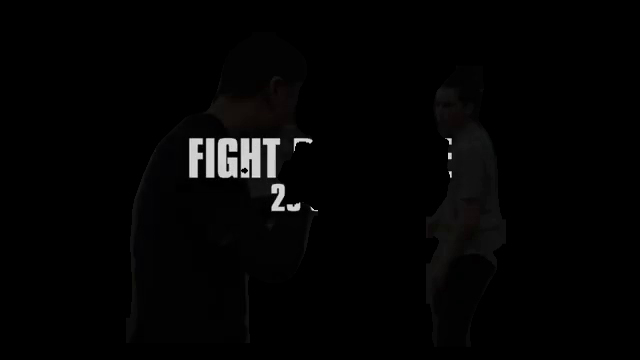


0: 384x640 2 persons, 8.7ms
Speed: 2.1ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


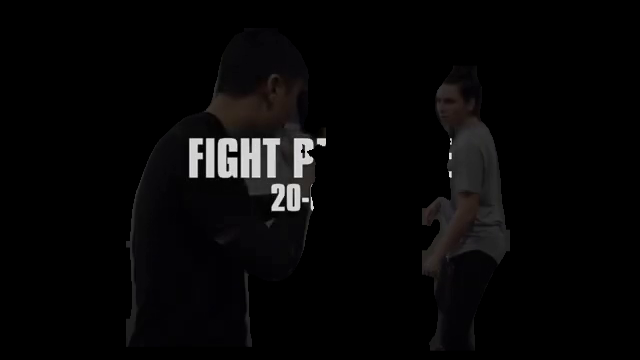


0: 384x640 3 persons, 14.6ms
Speed: 1.6ms preprocess, 14.6ms inference, 3.1ms postprocess per image at shape (1, 3, 384, 640)


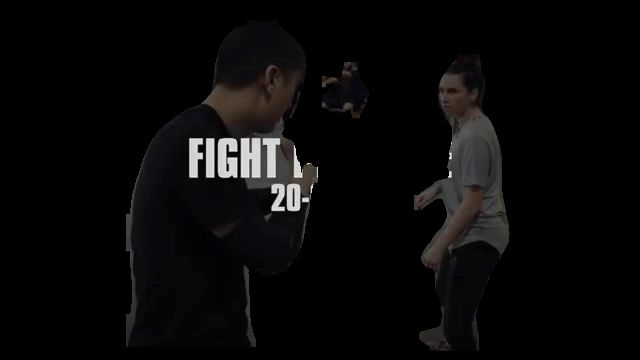


0: 384x640 3 persons, 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


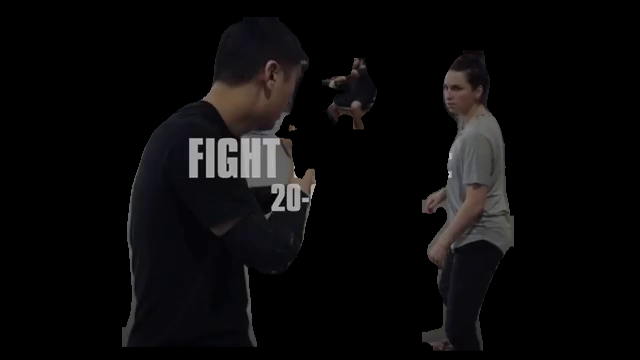


0: 384x640 5 persons, 14.4ms
Speed: 1.9ms preprocess, 14.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


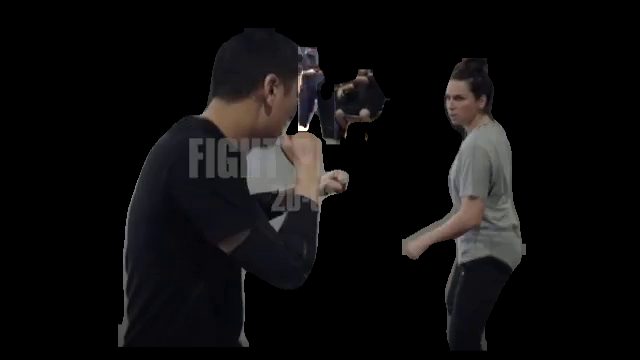


0: 384x640 5 persons, 12.2ms
Speed: 1.5ms preprocess, 12.2ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)


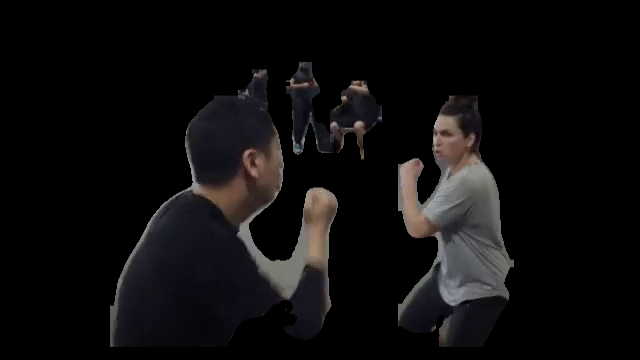


0: 384x640 5 persons, 12.8ms
Speed: 1.6ms preprocess, 12.8ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


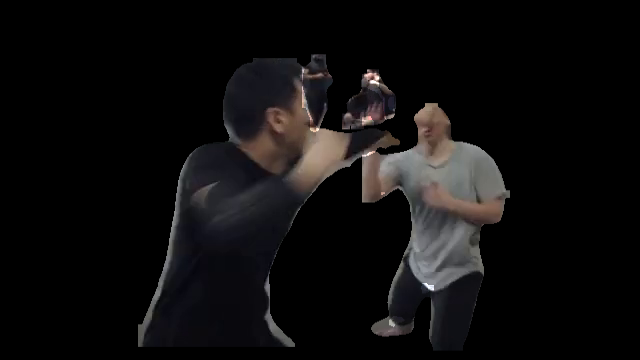


0: 384x640 5 persons, 1 chair, 14.8ms
Speed: 1.5ms preprocess, 14.8ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)


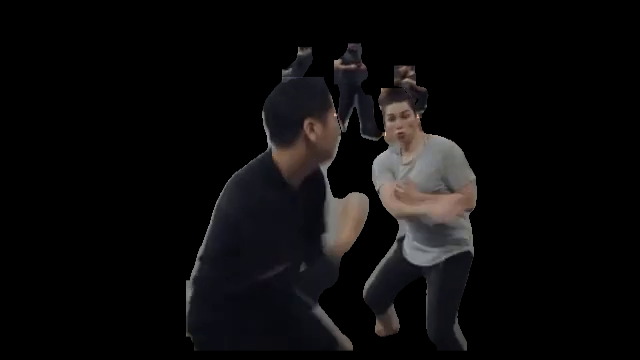


0: 384x640 3 persons, 14.7ms
Speed: 1.6ms preprocess, 14.7ms inference, 3.3ms postprocess per image at shape (1, 3, 384, 640)


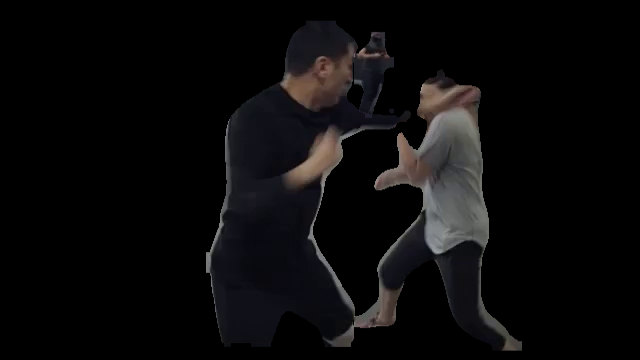


0: 384x640 3 persons, 1 cell phone, 14.0ms
Speed: 1.8ms preprocess, 14.0ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


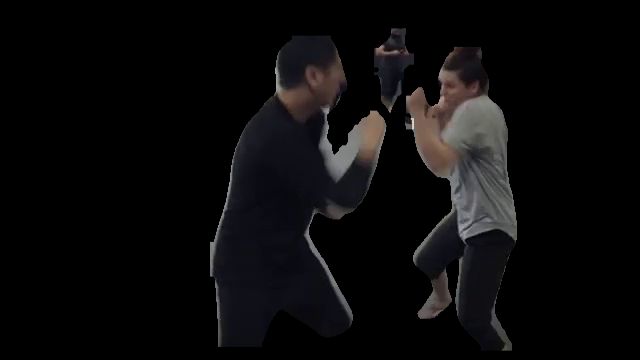


0: 384x640 4 persons, 13.5ms
Speed: 1.7ms preprocess, 13.5ms inference, 3.1ms postprocess per image at shape (1, 3, 384, 640)


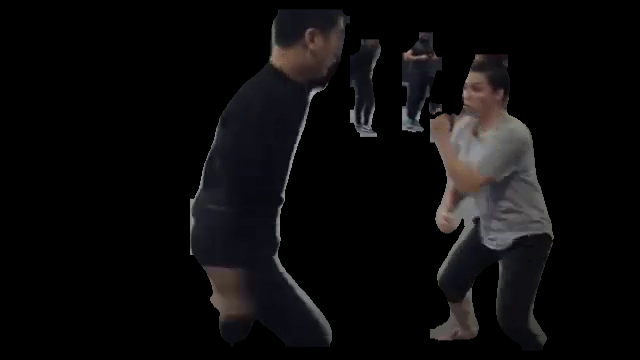


0: 384x640 6 persons, 12.8ms
Speed: 1.6ms preprocess, 12.8ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)


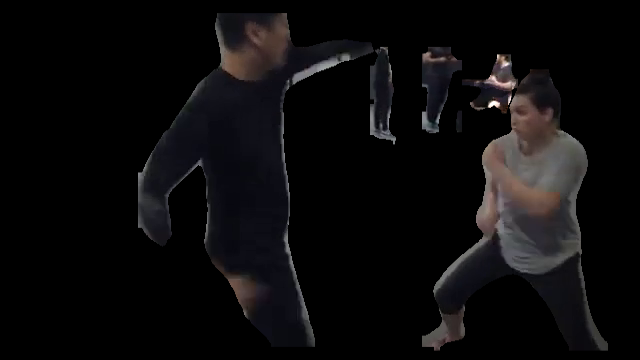


0: 384x640 6 persons, 1 tv, 10.6ms
Speed: 1.7ms preprocess, 10.6ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


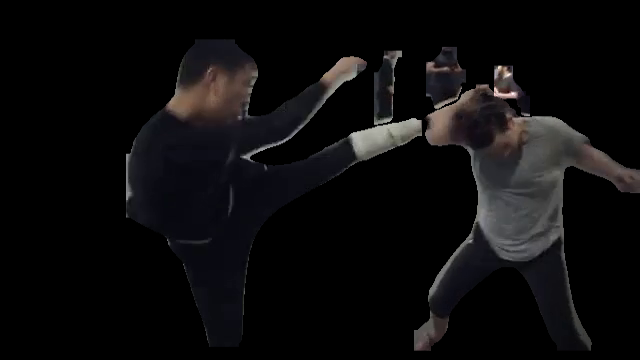


0: 384x640 5 persons, 11.4ms
Speed: 1.4ms preprocess, 11.4ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)


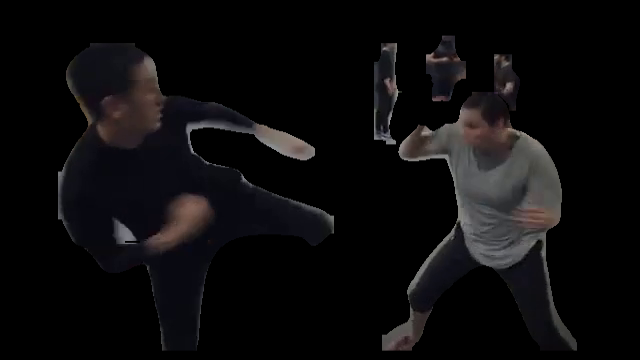


0: 384x640 5 persons, 16.6ms
Speed: 2.6ms preprocess, 16.6ms inference, 3.3ms postprocess per image at shape (1, 3, 384, 640)


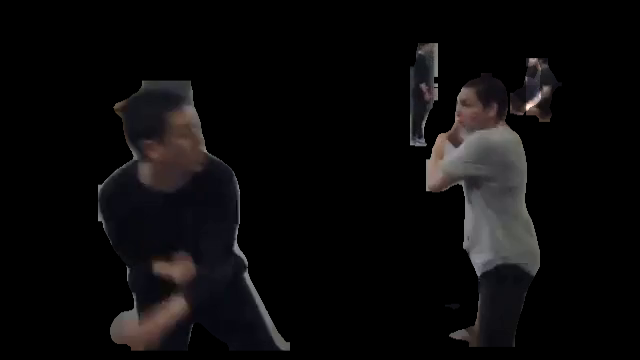


0: 384x640 5 persons, 19.9ms
Speed: 1.6ms preprocess, 19.9ms inference, 4.8ms postprocess per image at shape (1, 3, 384, 640)


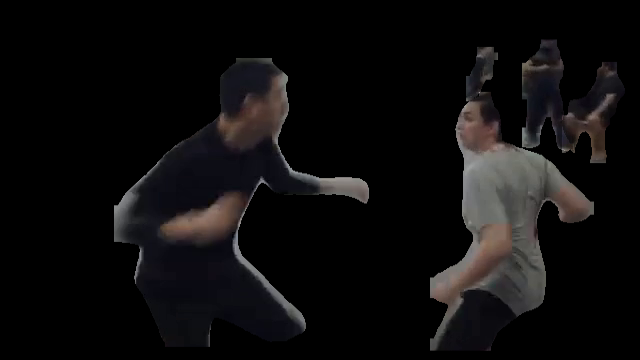


0: 384x640 3 persons, 1 suitcase, 21.1ms
Speed: 1.6ms preprocess, 21.1ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)


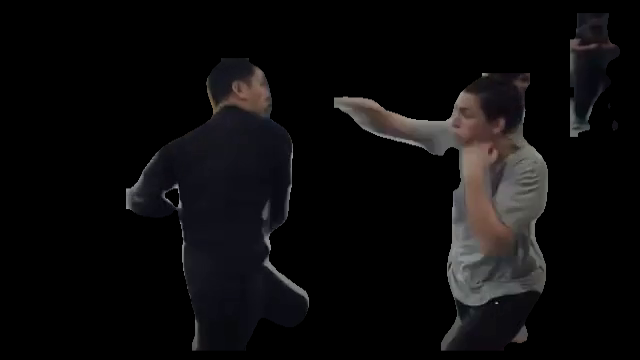


0: 384x640 4 persons, 2 suitcases, 20.6ms
Speed: 1.5ms preprocess, 20.6ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


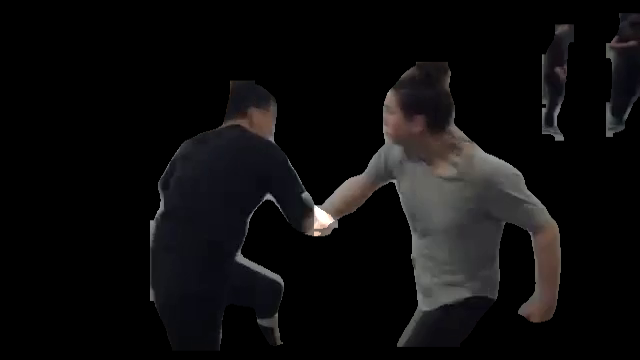


0: 384x640 2 persons, 18.5ms
Speed: 1.7ms preprocess, 18.5ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


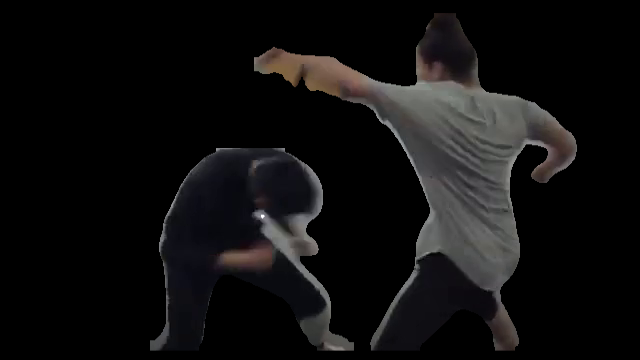


0: 384x640 2 persons, 15.8ms
Speed: 1.5ms preprocess, 15.8ms inference, 6.6ms postprocess per image at shape (1, 3, 384, 640)


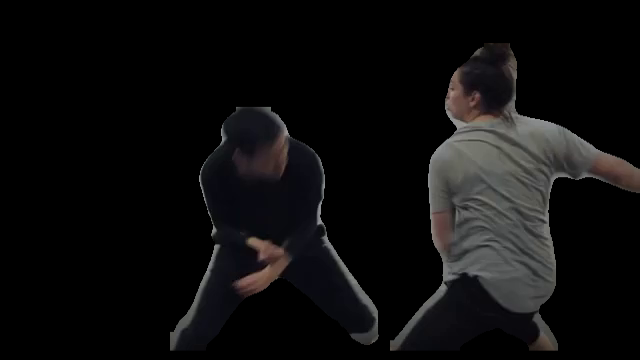


0: 384x640 2 persons, 20.0ms
Speed: 2.3ms preprocess, 20.0ms inference, 4.8ms postprocess per image at shape (1, 3, 384, 640)


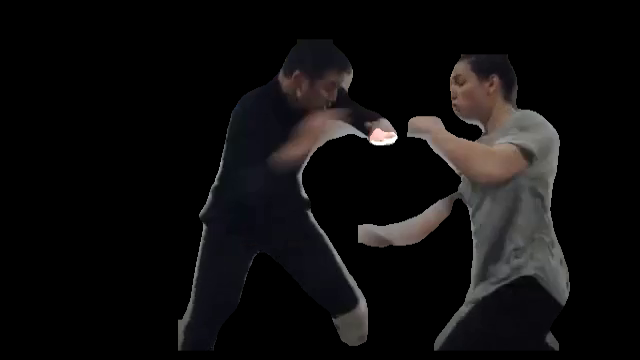


0: 384x640 2 persons, 19.4ms
Speed: 1.7ms preprocess, 19.4ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)


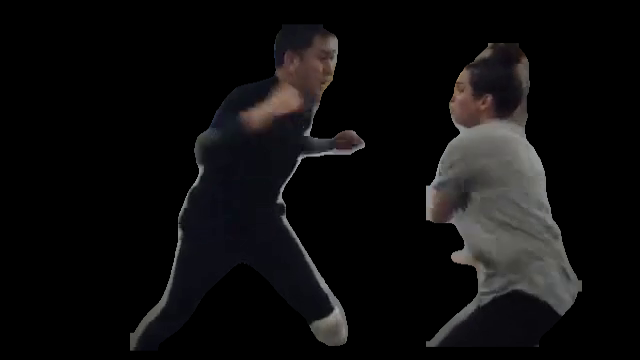


0: 384x640 3 persons, 15.0ms
Speed: 1.6ms preprocess, 15.0ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


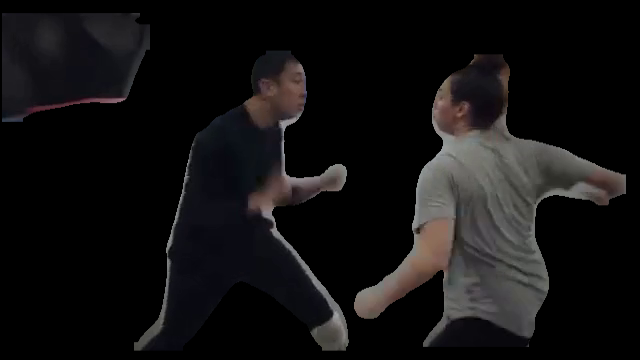


0: 384x640 2 persons, 15.7ms
Speed: 1.7ms preprocess, 15.7ms inference, 7.9ms postprocess per image at shape (1, 3, 384, 640)


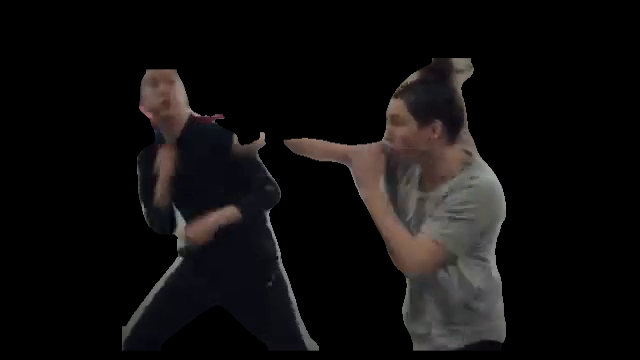


0: 384x640 2 persons, 15.9ms
Speed: 1.6ms preprocess, 15.9ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


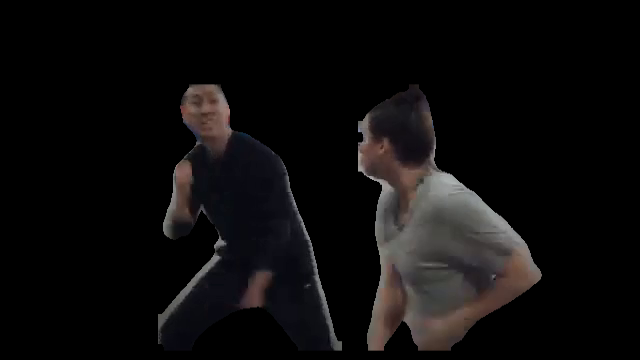


0: 384x640 2 persons, 19.7ms
Speed: 1.5ms preprocess, 19.7ms inference, 7.9ms postprocess per image at shape (1, 3, 384, 640)


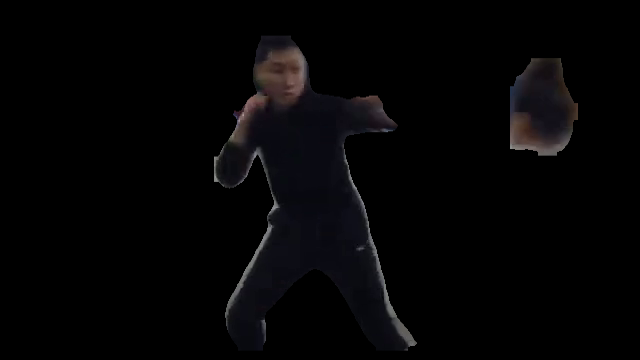


0: 384x640 2 persons, 20.1ms
Speed: 1.6ms preprocess, 20.1ms inference, 7.0ms postprocess per image at shape (1, 3, 384, 640)


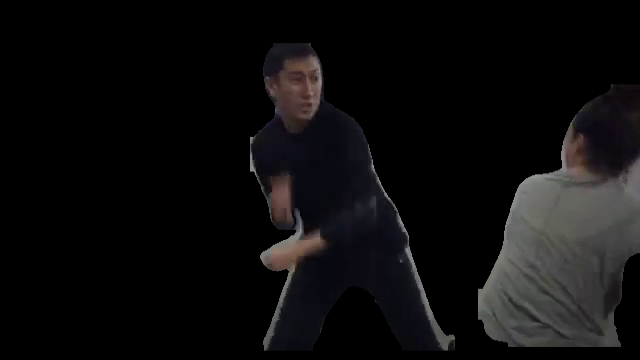


0: 384x640 2 persons, 16.1ms
Speed: 1.7ms preprocess, 16.1ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)


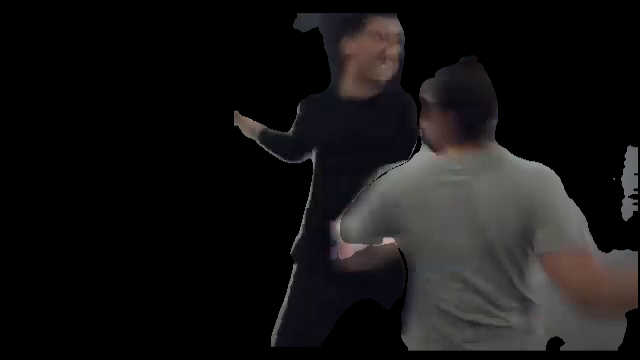


0: 384x640 2 persons, 11.7ms
Speed: 1.5ms preprocess, 11.7ms inference, 5.5ms postprocess per image at shape (1, 3, 384, 640)


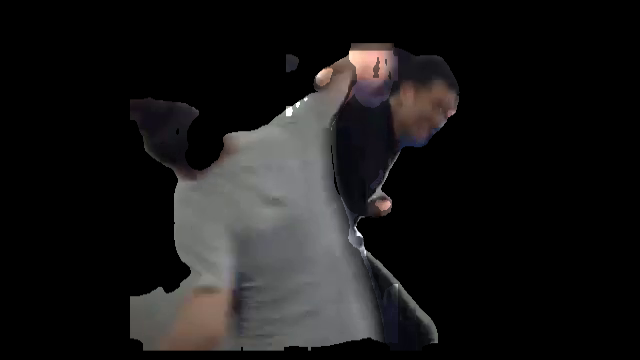


0: 384x640 2 persons, 14.6ms
Speed: 2.0ms preprocess, 14.6ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)


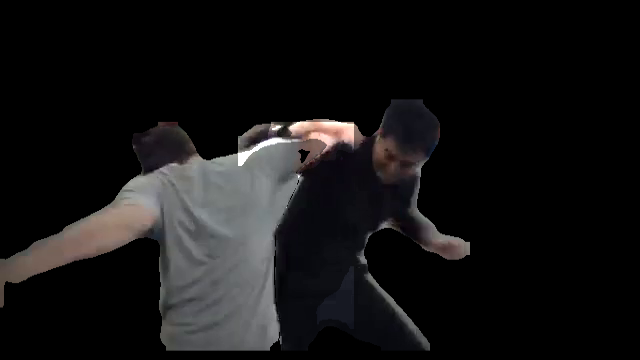


0: 384x640 3 persons, 1 cell phone, 12.0ms
Speed: 1.8ms preprocess, 12.0ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)


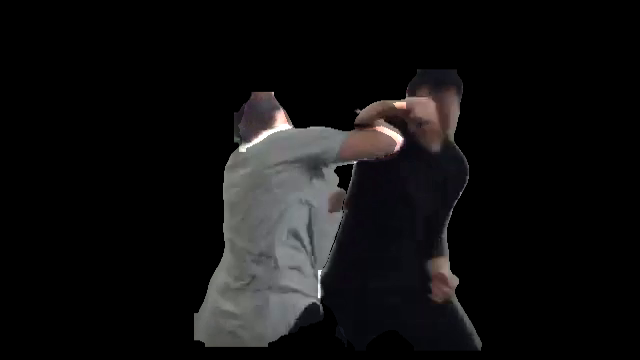


0: 384x640 2 persons, 1 suitcase, 12.5ms
Speed: 1.6ms preprocess, 12.5ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


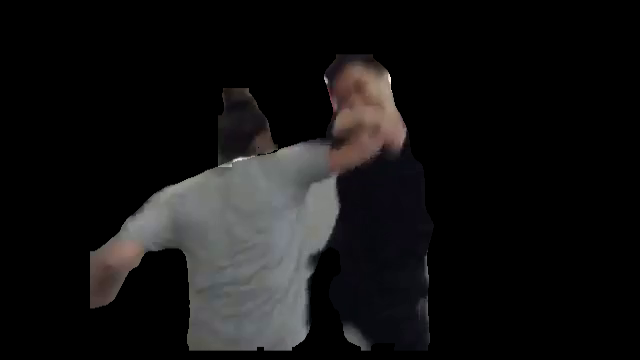


0: 384x640 2 persons, 15.1ms
Speed: 1.5ms preprocess, 15.1ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


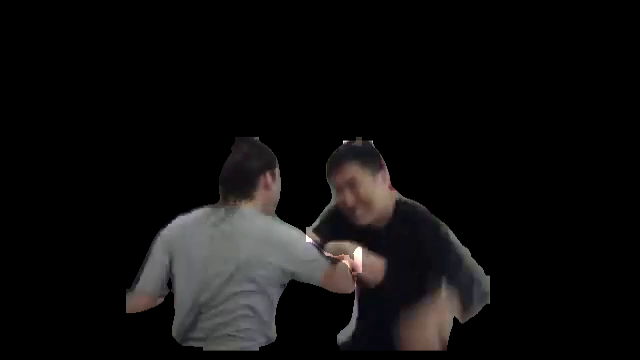


0: 384x640 2 persons, 1 suitcase, 10.3ms
Speed: 1.5ms preprocess, 10.3ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 640)


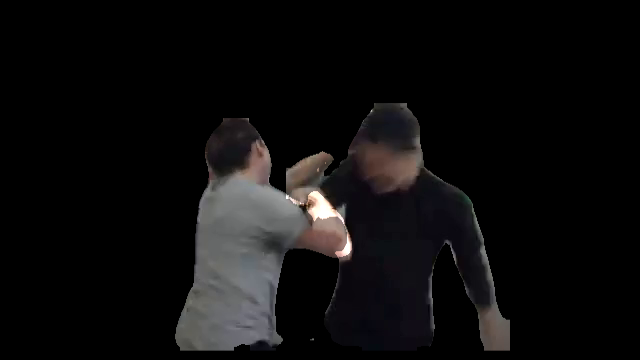


0: 384x640 2 persons, 21.1ms
Speed: 1.6ms preprocess, 21.1ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


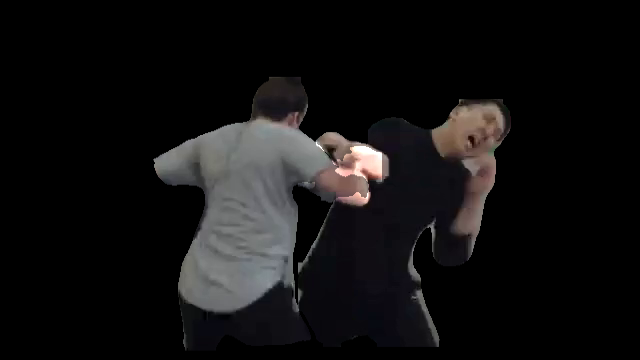


0: 384x640 2 persons, 22.1ms
Speed: 1.5ms preprocess, 22.1ms inference, 4.7ms postprocess per image at shape (1, 3, 384, 640)


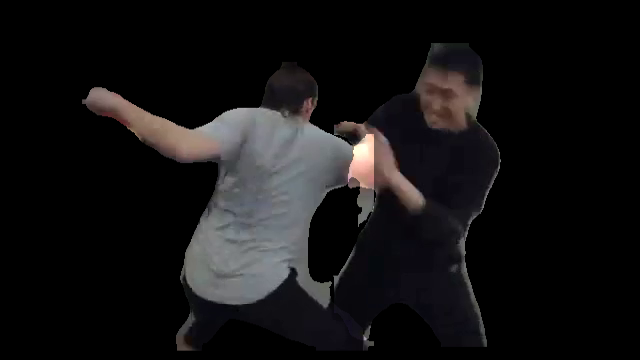


0: 384x640 2 persons, 12.2ms
Speed: 2.2ms preprocess, 12.2ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


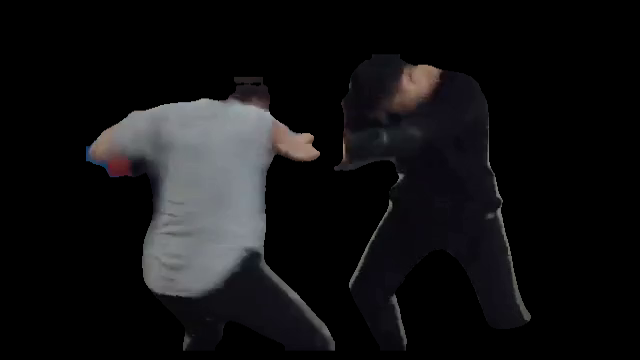


0: 384x640 3 persons, 12.2ms
Speed: 1.5ms preprocess, 12.2ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)


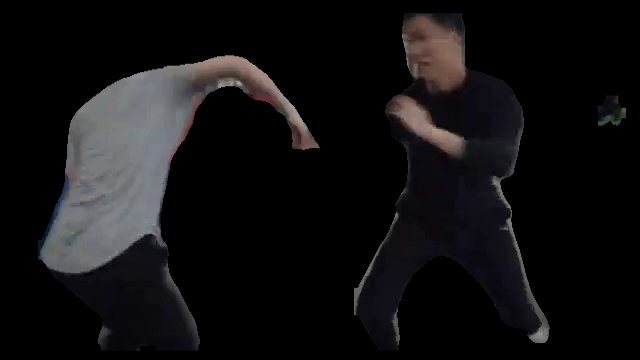


0: 384x640 2 persons, 1 chair, 1 cell phone, 21.2ms
Speed: 1.5ms preprocess, 21.2ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


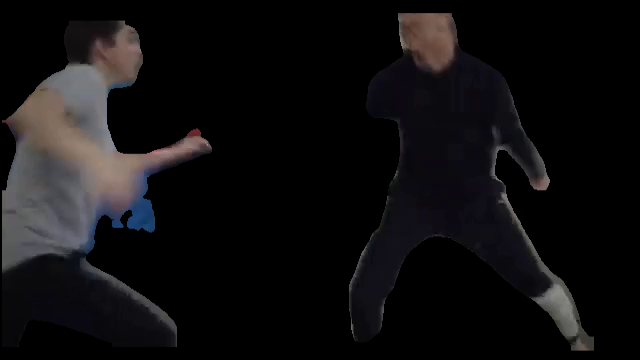


0: 384x640 5 persons, 1 suitcase, 1 snowboard, 1 chair, 11.6ms
Speed: 1.8ms preprocess, 11.6ms inference, 4.4ms postprocess per image at shape (1, 3, 384, 640)


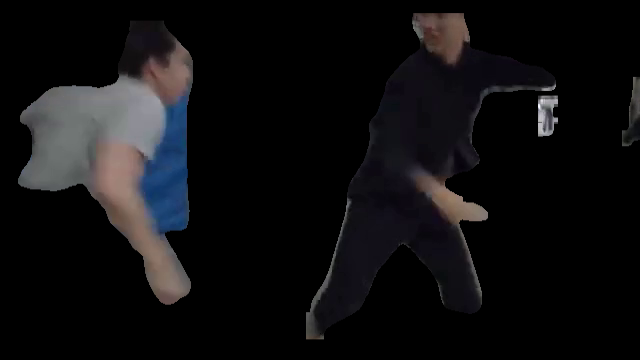


0: 384x640 2 persons, 1 chair, 13.3ms
Speed: 2.2ms preprocess, 13.3ms inference, 4.4ms postprocess per image at shape (1, 3, 384, 640)


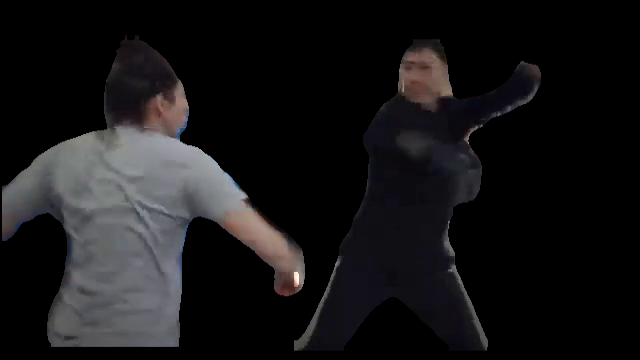


0: 384x640 2 persons, 1 cell phone, 11.2ms
Speed: 1.4ms preprocess, 11.2ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)


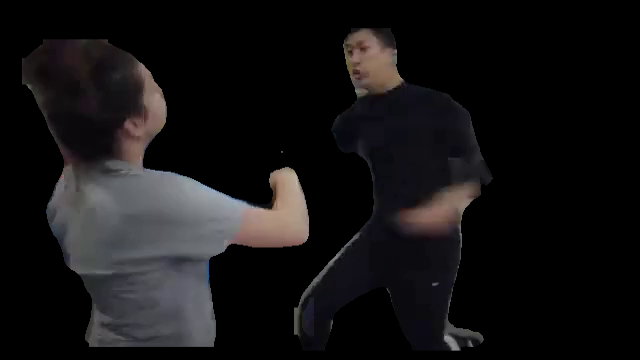


0: 384x640 2 persons, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


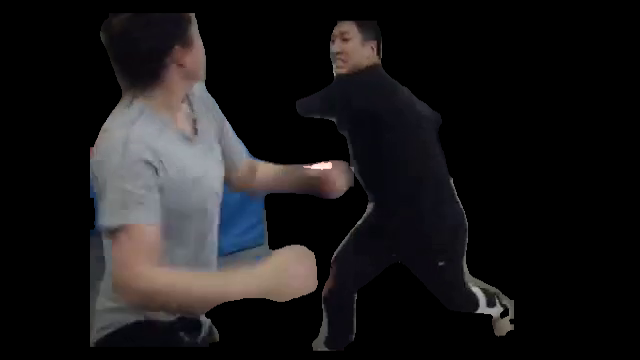


0: 384x640 2 persons, 14.7ms
Speed: 1.8ms preprocess, 14.7ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


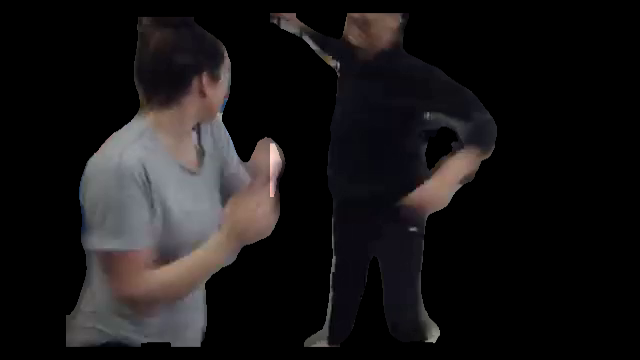


0: 384x640 2 persons, 15.1ms
Speed: 1.8ms preprocess, 15.1ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


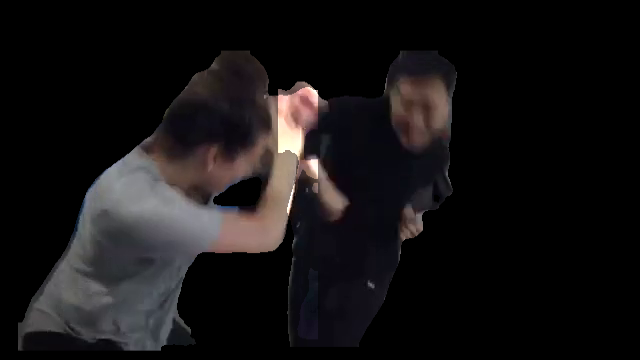


0: 384x640 2 persons, 15.1ms
Speed: 1.5ms preprocess, 15.1ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)


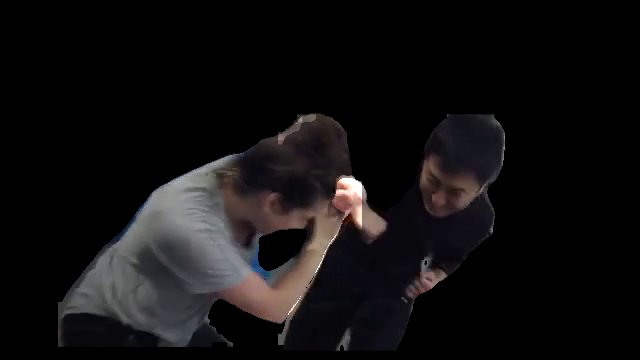


0: 384x640 2 persons, 13.9ms
Speed: 2.0ms preprocess, 13.9ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)


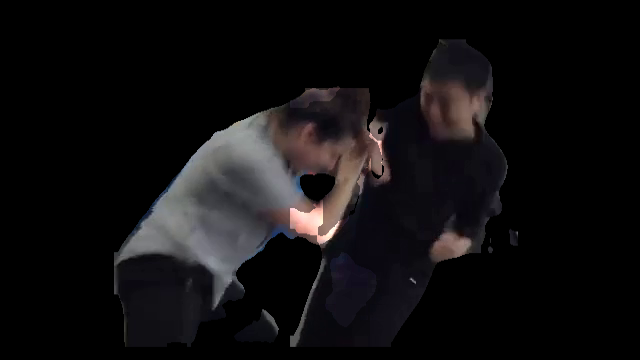


0: 384x640 2 persons, 15.7ms
Speed: 2.3ms preprocess, 15.7ms inference, 6.8ms postprocess per image at shape (1, 3, 384, 640)


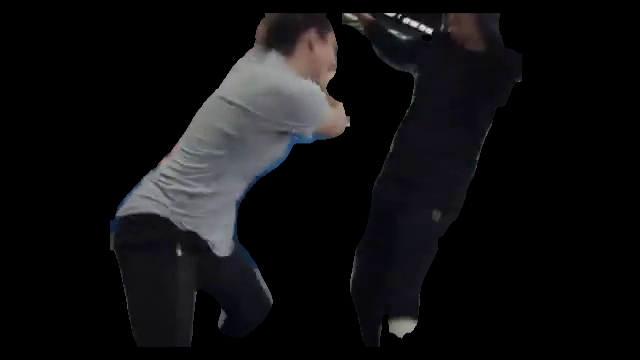


0: 384x640 2 persons, 22.2ms
Speed: 2.3ms preprocess, 22.2ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)


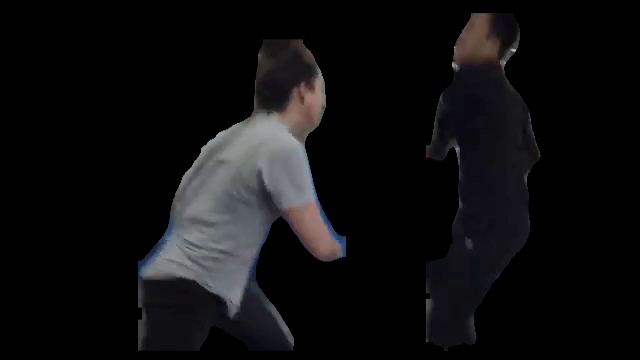


0: 384x640 2 persons, 1 suitcase, 19.9ms
Speed: 1.6ms preprocess, 19.9ms inference, 5.0ms postprocess per image at shape (1, 3, 384, 640)


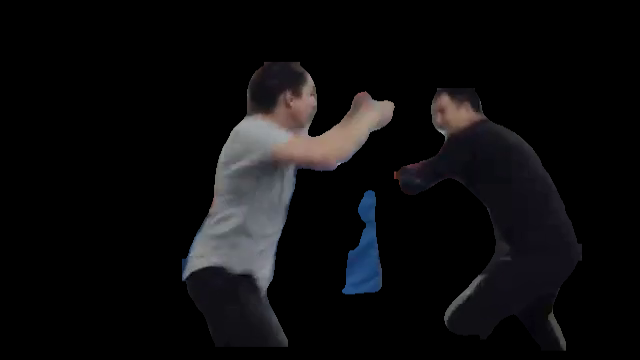


0: 384x640 2 persons, 2 handbags, 22.0ms
Speed: 2.3ms preprocess, 22.0ms inference, 5.7ms postprocess per image at shape (1, 3, 384, 640)


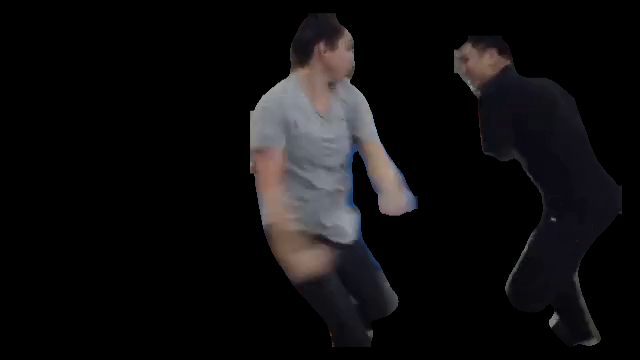


0: 384x640 2 persons, 11.5ms
Speed: 1.6ms preprocess, 11.5ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


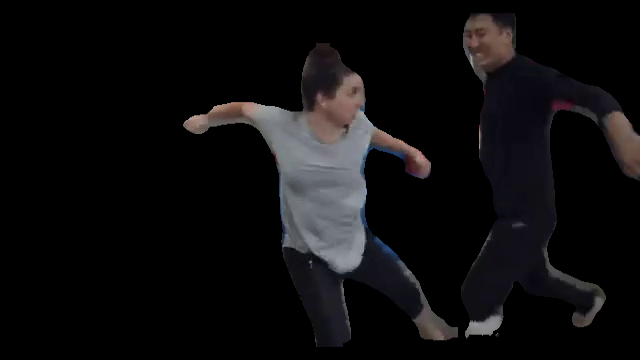


0: 384x640 2 persons, 1 parking meter, 11.7ms
Speed: 1.7ms preprocess, 11.7ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


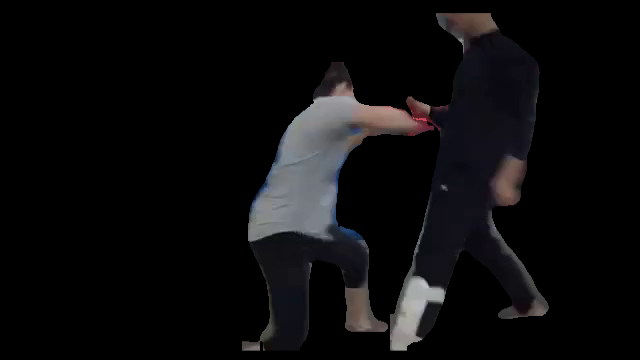


0: 384x640 2 persons, 11.2ms
Speed: 1.6ms preprocess, 11.2ms inference, 5.4ms postprocess per image at shape (1, 3, 384, 640)


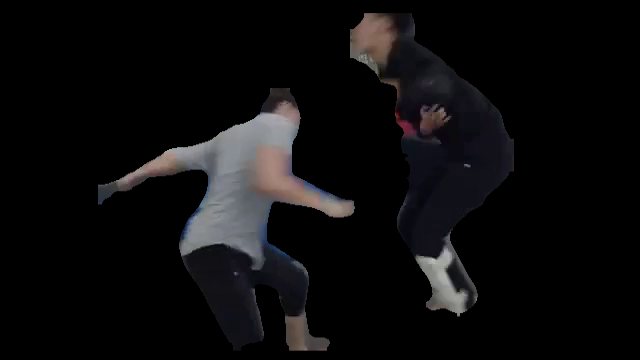


0: 384x640 3 persons, 1 car, 11.3ms
Speed: 1.5ms preprocess, 11.3ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


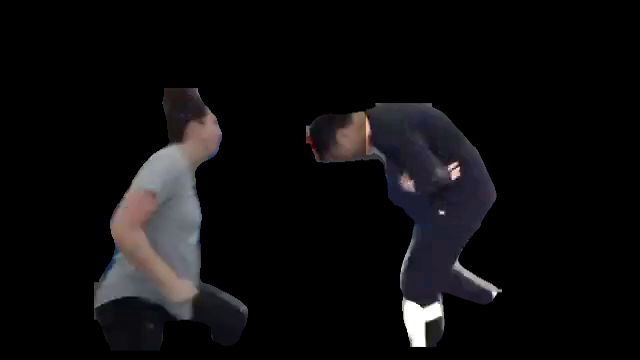


0: 384x640 4 persons, 1 skateboard, 25.6ms
Speed: 2.2ms preprocess, 25.6ms inference, 5.9ms postprocess per image at shape (1, 3, 384, 640)


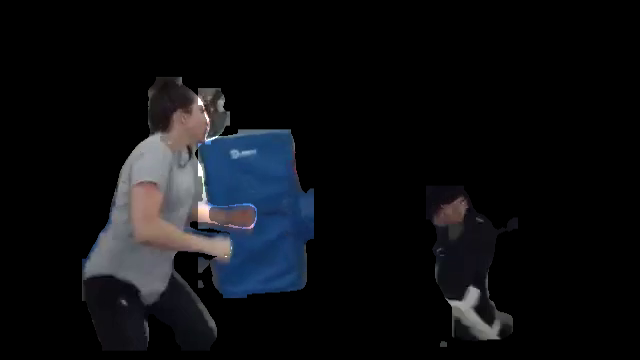


0: 384x640 2 persons, 1 cow, 13.4ms
Speed: 5.0ms preprocess, 13.4ms inference, 6.4ms postprocess per image at shape (1, 3, 384, 640)


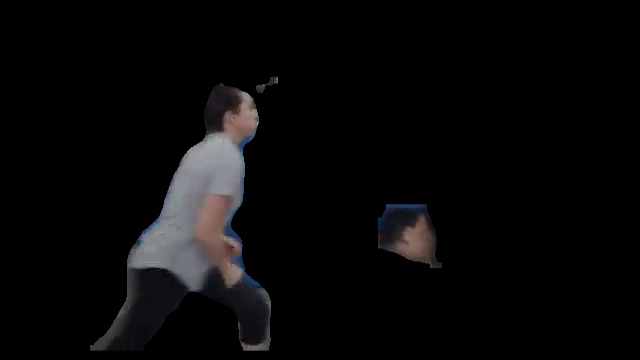


0: 384x640 2 persons, 1 cow, 15.8ms
Speed: 1.8ms preprocess, 15.8ms inference, 5.4ms postprocess per image at shape (1, 3, 384, 640)


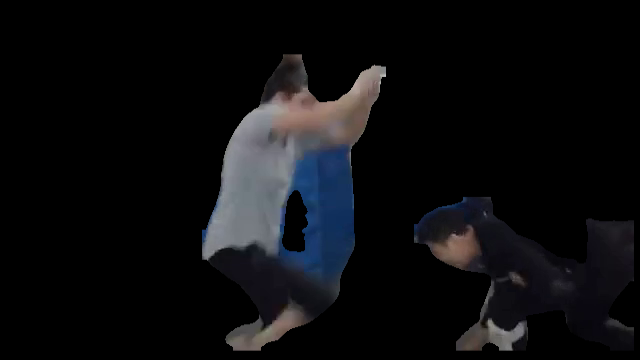


0: 384x640 3 persons, 10.2ms
Speed: 1.7ms preprocess, 10.2ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


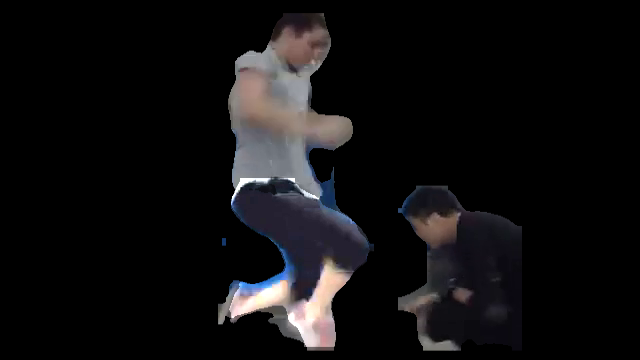


0: 384x640 3 persons, 1 suitcase, 10.3ms
Speed: 1.5ms preprocess, 10.3ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


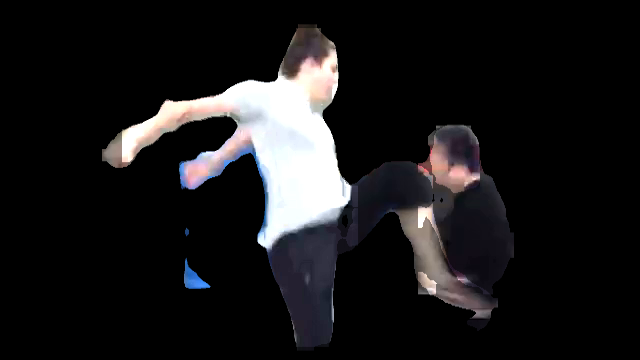


0: 384x640 2 persons, 1 suitcase, 11.1ms
Speed: 1.6ms preprocess, 11.1ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


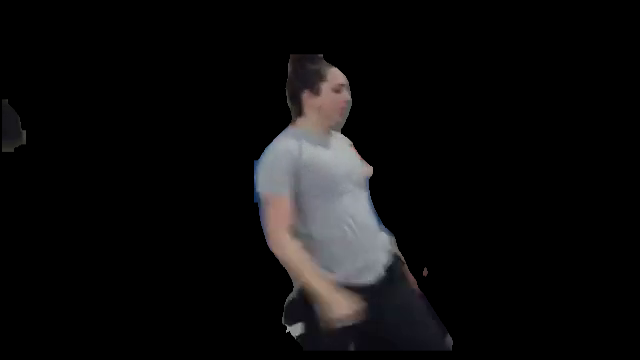


0: 384x640 2 persons, 10.5ms
Speed: 1.6ms preprocess, 10.5ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)


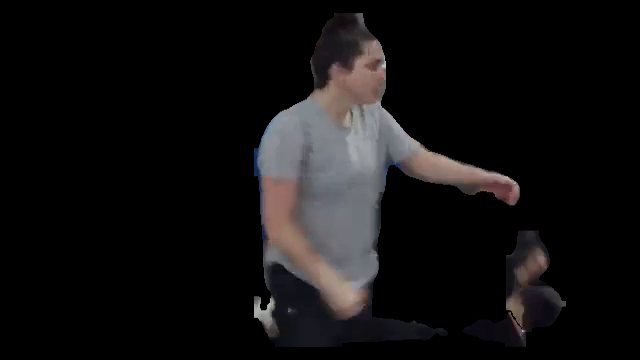


0: 384x640 1 person, 1 bench, 14.3ms
Speed: 1.6ms preprocess, 14.3ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)


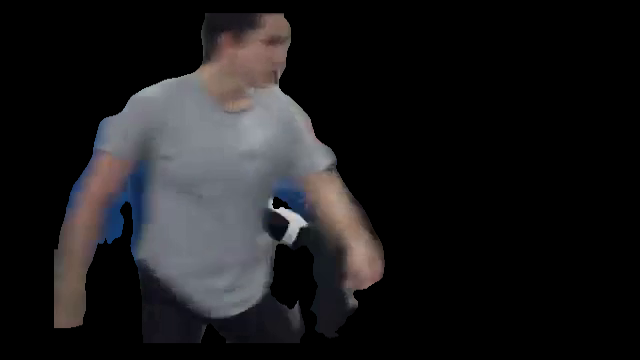


0: 384x640 2 persons, 11.4ms
Speed: 1.5ms preprocess, 11.4ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)


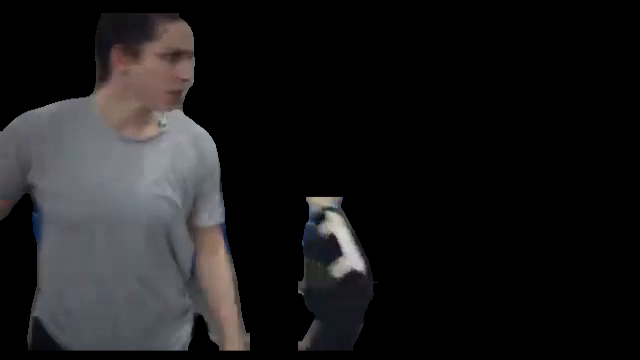


0: 384x640 1 person, 10.8ms
Speed: 1.6ms preprocess, 10.8ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


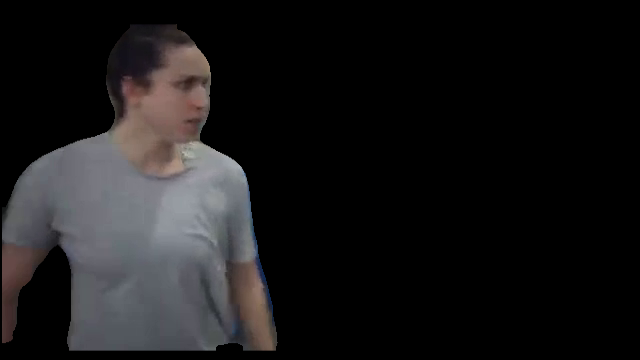


0: 384x640 2 persons, 10.8ms
Speed: 1.9ms preprocess, 10.8ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


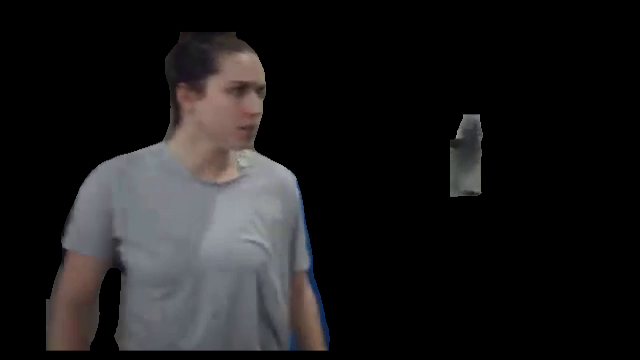


0: 384x640 1 person, 10.3ms
Speed: 1.6ms preprocess, 10.3ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


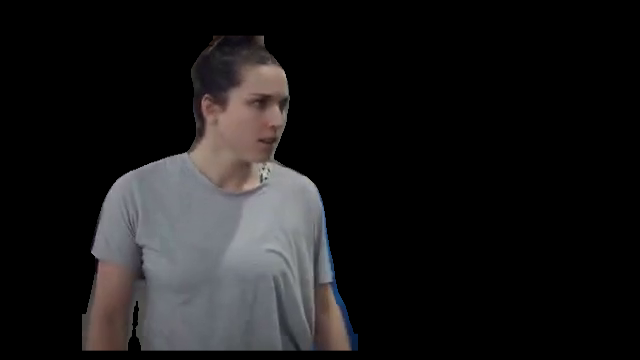


0: 384x640 1 person, 11.1ms
Speed: 1.5ms preprocess, 11.1ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


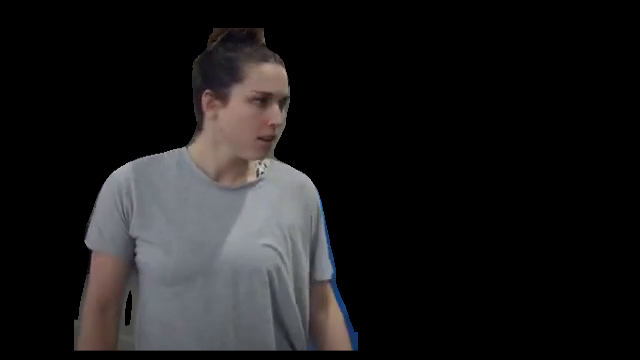


0: 384x640 1 person, 14.6ms
Speed: 1.6ms preprocess, 14.6ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)


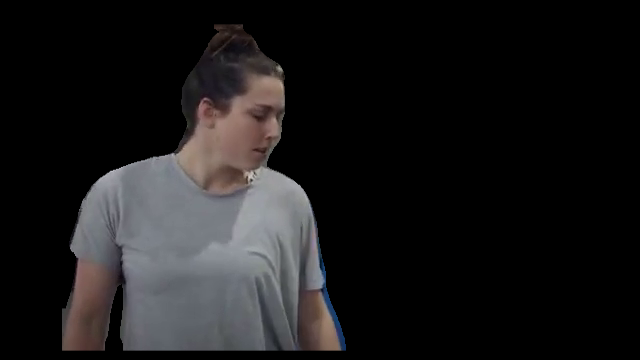


0: 384x640 1 person, 1 car, 13.9ms
Speed: 1.6ms preprocess, 13.9ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


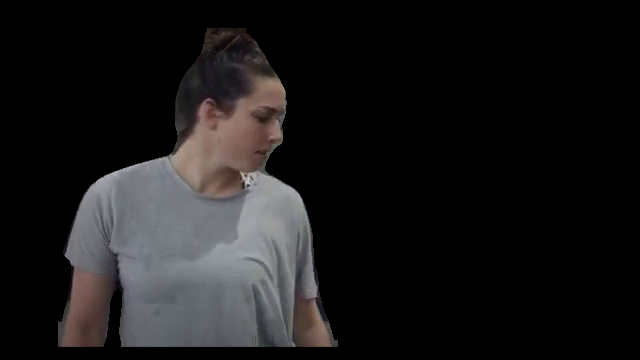


0: 384x640 1 person, 1 car, 22.3ms
Speed: 1.5ms preprocess, 22.3ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


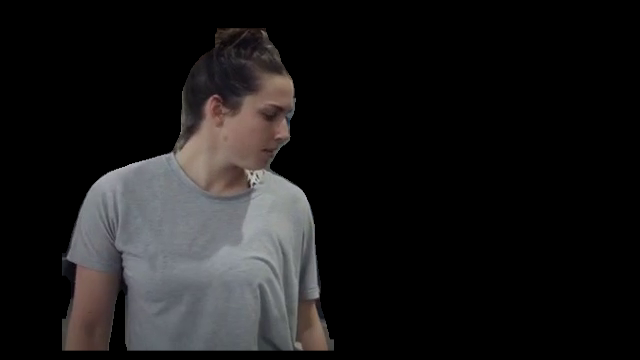


0: 384x640 1 person, 14.1ms
Speed: 1.7ms preprocess, 14.1ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


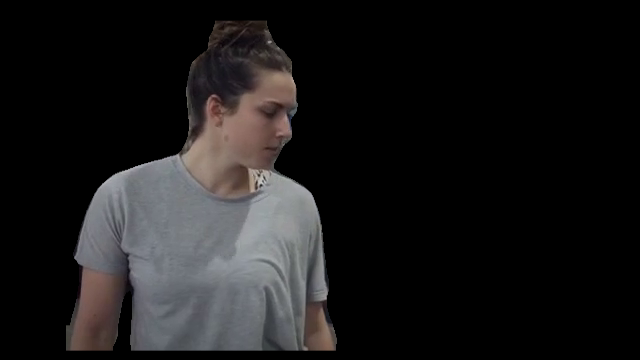


0: 384x640 1 person, 12.4ms
Speed: 1.6ms preprocess, 12.4ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)


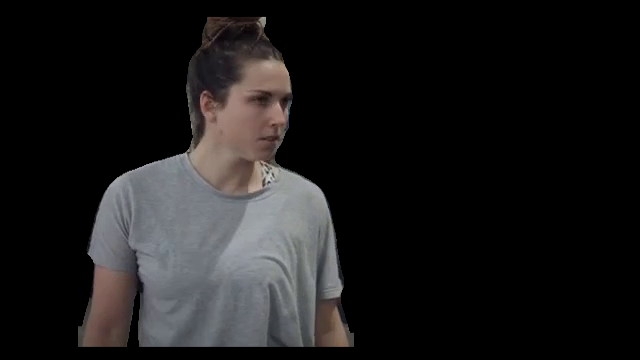


0: 384x640 1 person, 12.0ms
Speed: 1.5ms preprocess, 12.0ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


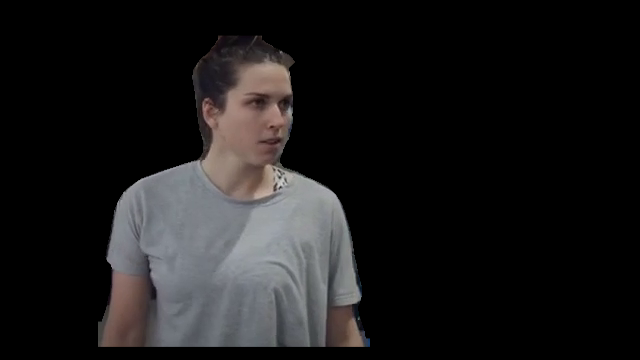


0: 384x640 1 person, 11.8ms
Speed: 1.5ms preprocess, 11.8ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


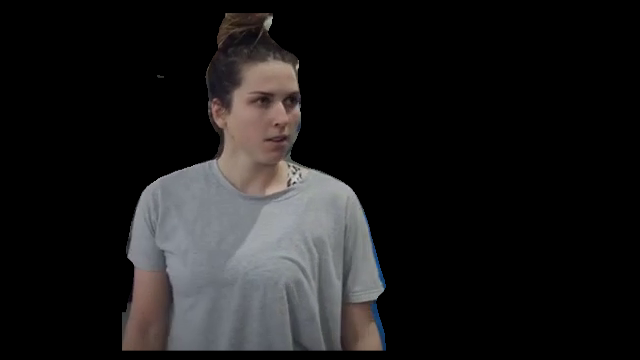


0: 384x640 1 person, 11.9ms
Speed: 1.6ms preprocess, 11.9ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


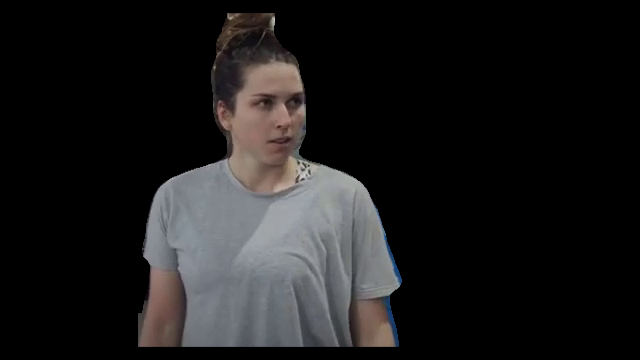


0: 384x640 (no detections), 12.1ms
Speed: 1.5ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 415

0: 384x640 (no detections), 11.5ms
Speed: 1.9ms preprocess, 11.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 420

0: 384x640 (no detections), 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 425

0: 384x640 (no detections), 10.7ms
Speed: 1.2ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 430

0: 384x640 (no detections), 10.1ms
Speed: 1.2ms preprocess, 10.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 435

0: 384x640 (no detections), 10.9ms
Speed: 1.2ms preprocess, 10.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
No masks detected in frame 440

0: 384x640 (no 

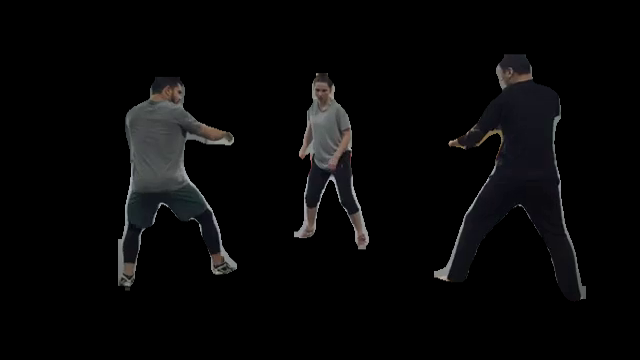


0: 384x640 3 persons, 11.7ms
Speed: 1.6ms preprocess, 11.7ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)


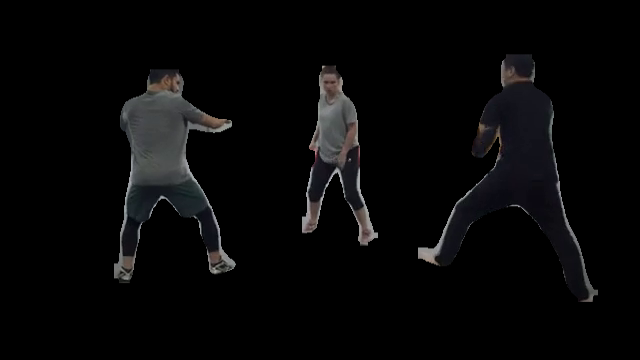


0: 384x640 3 persons, 12.6ms
Speed: 1.7ms preprocess, 12.6ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


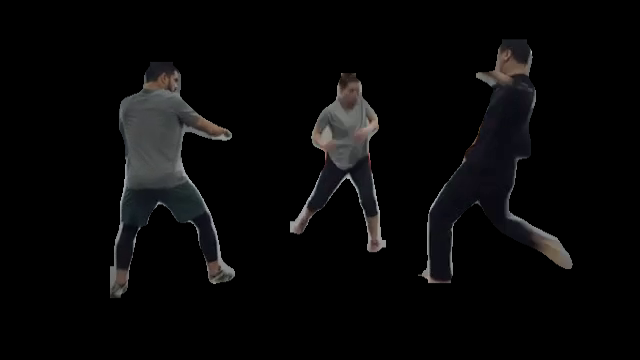


0: 384x640 3 persons, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 4.3ms postprocess per image at shape (1, 3, 384, 640)


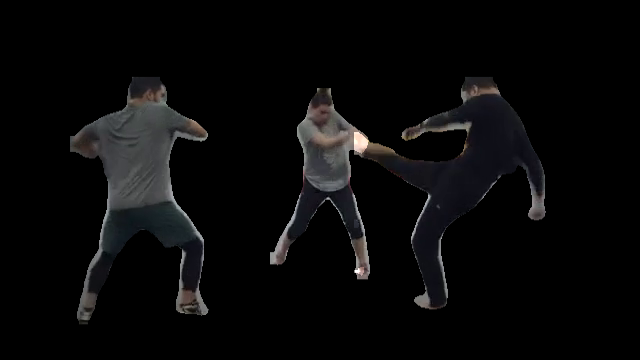


0: 384x640 3 persons, 17.1ms
Speed: 1.8ms preprocess, 17.1ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)


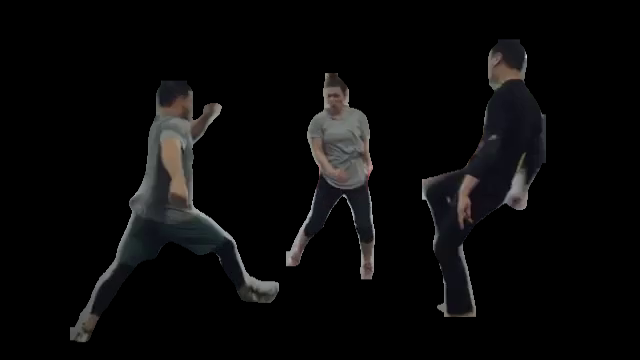


0: 384x640 3 persons, 11.4ms
Speed: 1.6ms preprocess, 11.4ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


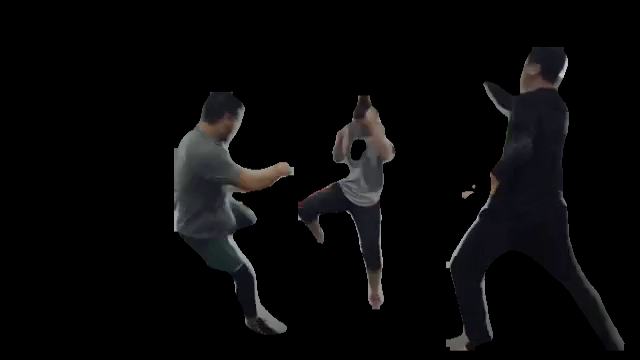


0: 384x640 3 persons, 11.0ms
Speed: 1.6ms preprocess, 11.0ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


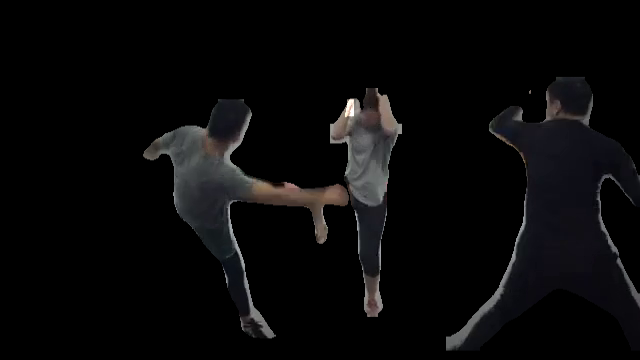


0: 384x640 3 persons, 10.2ms
Speed: 1.6ms preprocess, 10.2ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


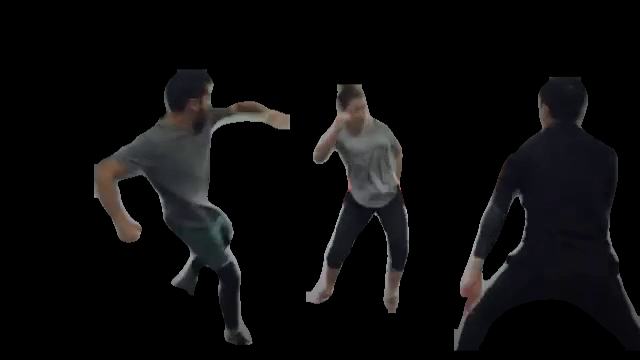


0: 384x640 3 persons, 11.0ms
Speed: 1.6ms preprocess, 11.0ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


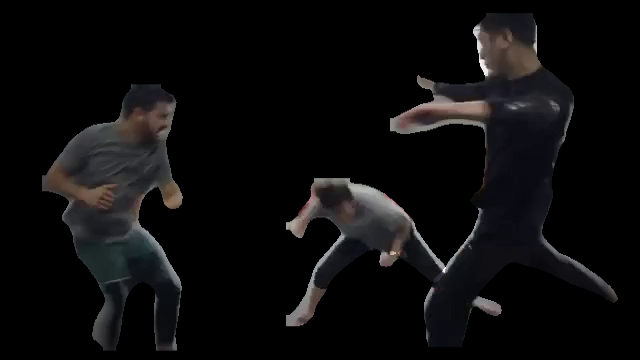


0: 384x640 2 persons, 1 frisbee, 14.7ms
Speed: 1.6ms preprocess, 14.7ms inference, 3.8ms postprocess per image at shape (1, 3, 384, 640)


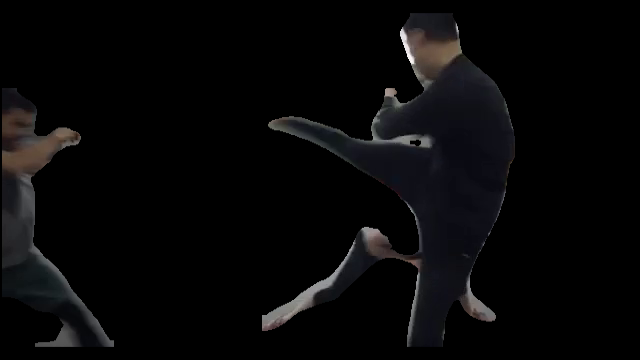


0: 384x640 1 person, 1 baseball bat, 13.2ms
Speed: 1.7ms preprocess, 13.2ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)


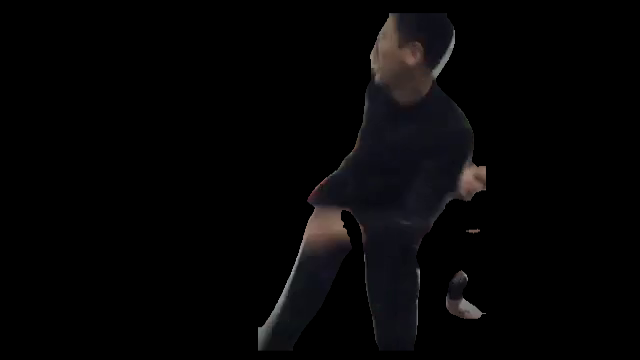


0: 384x640 2 persons, 1 laptop, 11.4ms
Speed: 1.5ms preprocess, 11.4ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


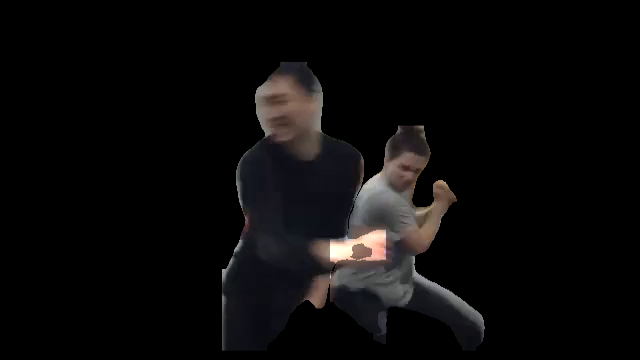


0: 384x640 2 persons, 10.5ms
Speed: 1.4ms preprocess, 10.5ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


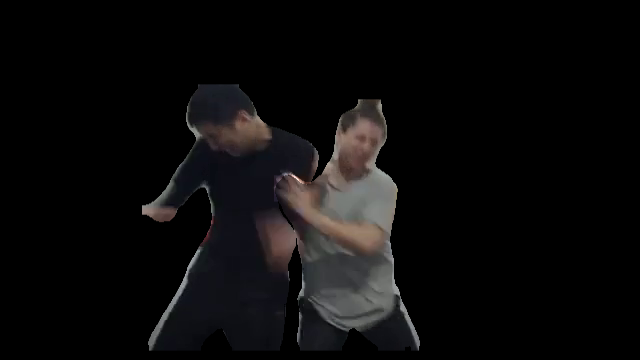


0: 384x640 2 persons, 1 cup, 1 bowl, 11.2ms
Speed: 1.6ms preprocess, 11.2ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


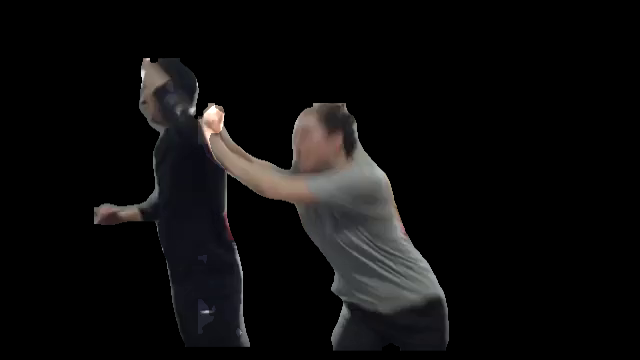


0: 384x640 2 persons, 1 dog, 11.1ms
Speed: 4.6ms preprocess, 11.1ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


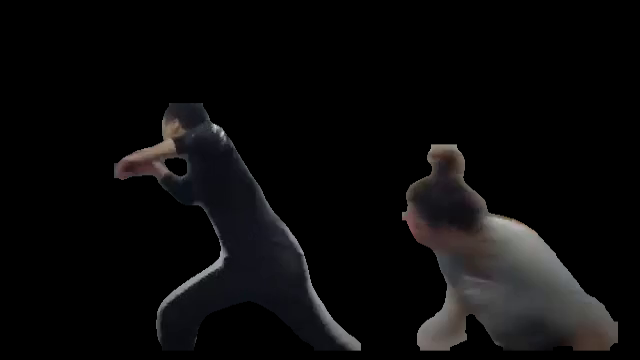


0: 384x640 2 persons, 10.3ms
Speed: 1.7ms preprocess, 10.3ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


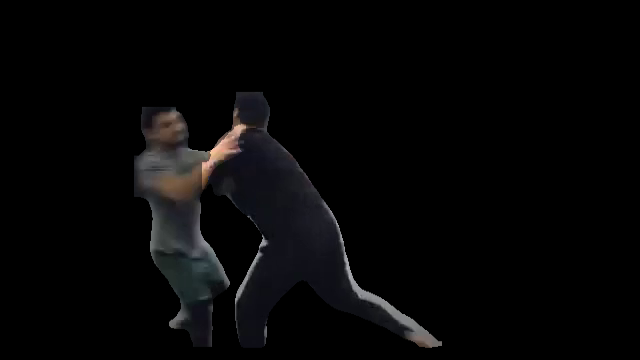


0: 384x640 2 persons, 1 couch, 11.5ms
Speed: 1.5ms preprocess, 11.5ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


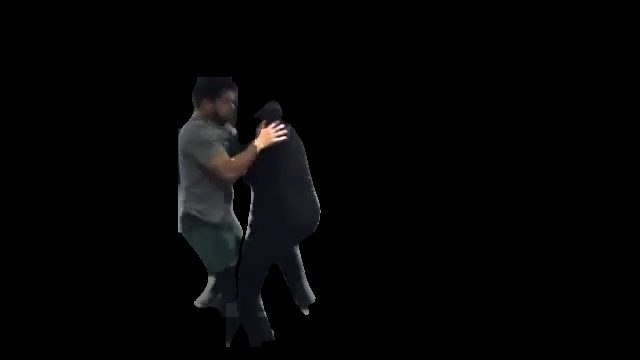


0: 384x640 2 persons, 11.0ms
Speed: 1.9ms preprocess, 11.0ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


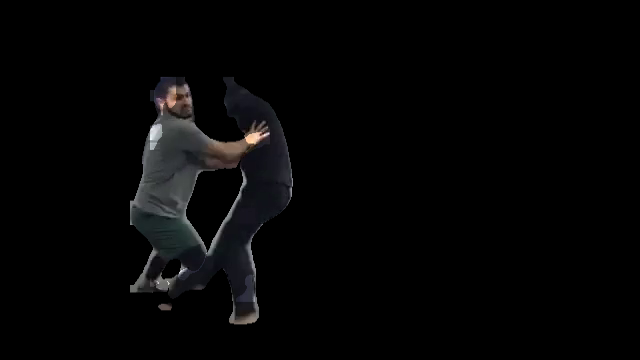


0: 384x640 3 persons, 10.5ms
Speed: 1.8ms preprocess, 10.5ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


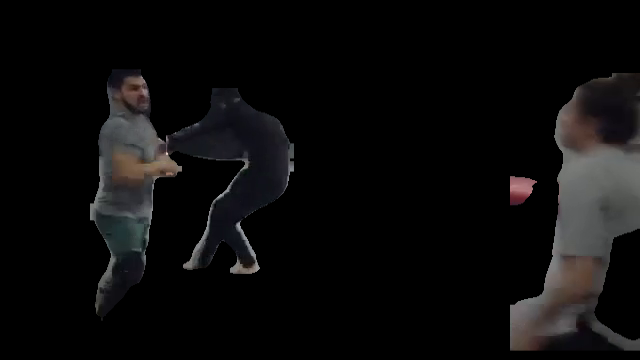


0: 384x640 2 persons, 1 dog, 19.9ms
Speed: 1.8ms preprocess, 19.9ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


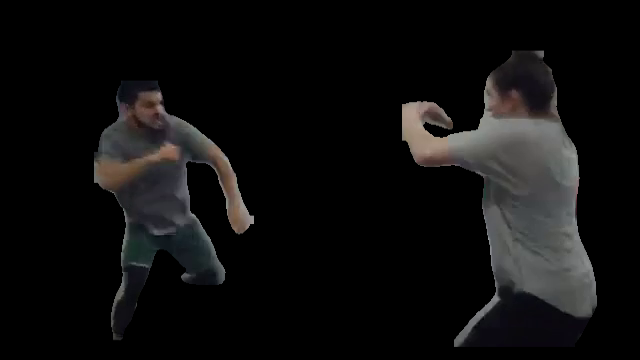


0: 384x640 2 persons, 1 dog, 13.6ms
Speed: 1.7ms preprocess, 13.6ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)


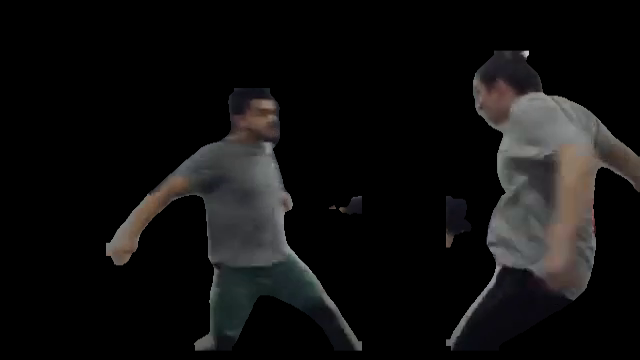


0: 384x640 3 persons, 1 dog, 10.4ms
Speed: 1.7ms preprocess, 10.4ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


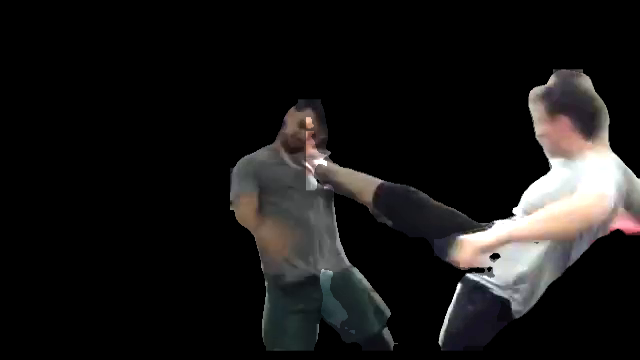


0: 384x640 4 persons, 1 dog, 12.3ms
Speed: 1.6ms preprocess, 12.3ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


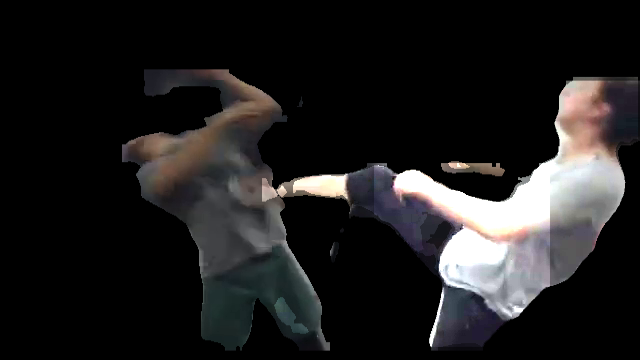


0: 384x640 2 persons, 1 dog, 13.3ms
Speed: 1.7ms preprocess, 13.3ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)


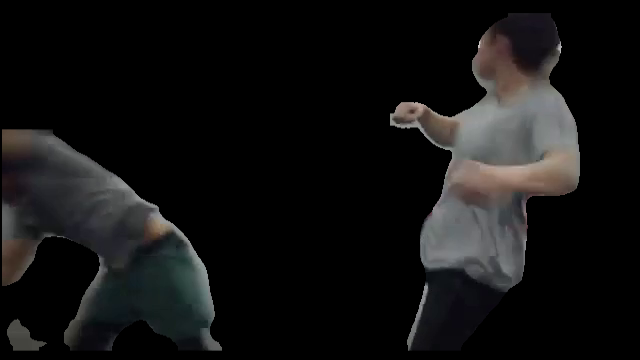


0: 384x640 2 persons, 13.5ms
Speed: 1.6ms preprocess, 13.5ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


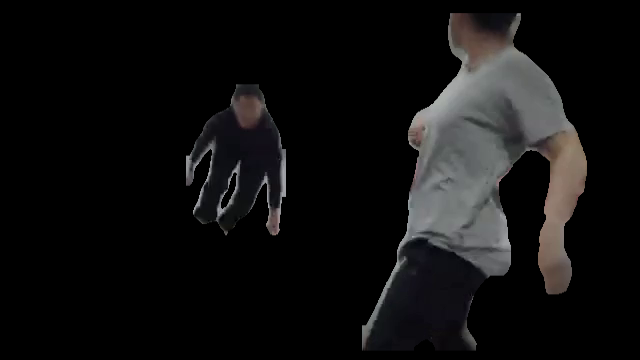


0: 384x640 2 persons, 10.8ms
Speed: 1.9ms preprocess, 10.8ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


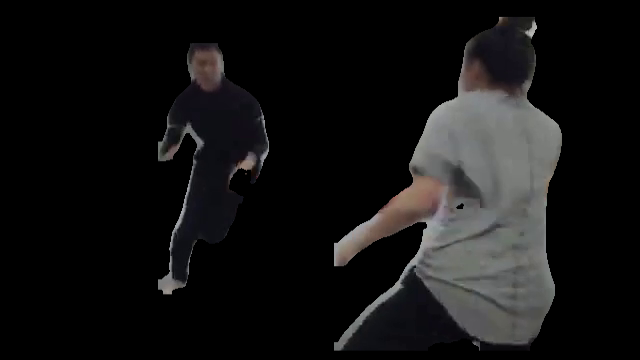


0: 384x640 2 persons, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


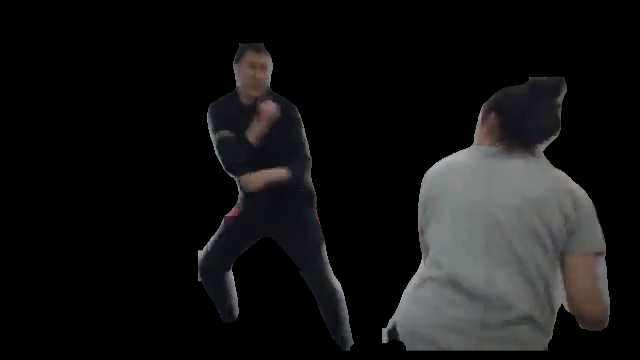


0: 384x640 2 persons, 1 remote, 13.3ms
Speed: 1.6ms preprocess, 13.3ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


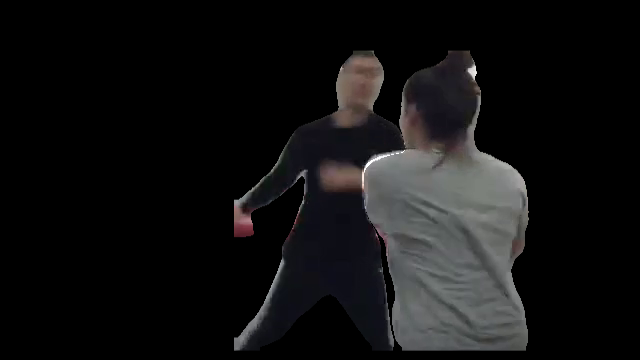


0: 384x640 2 persons, 15.9ms
Speed: 1.6ms preprocess, 15.9ms inference, 3.1ms postprocess per image at shape (1, 3, 384, 640)


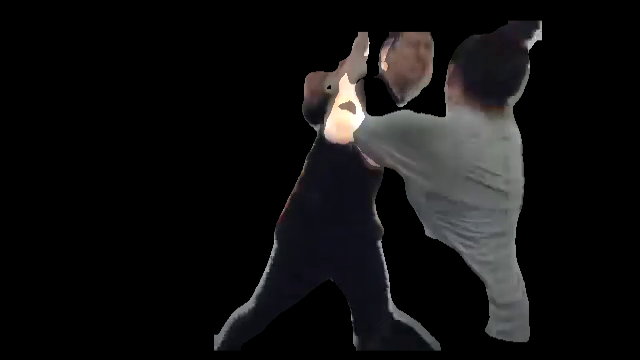


0: 384x640 3 persons, 10.9ms
Speed: 1.7ms preprocess, 10.9ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


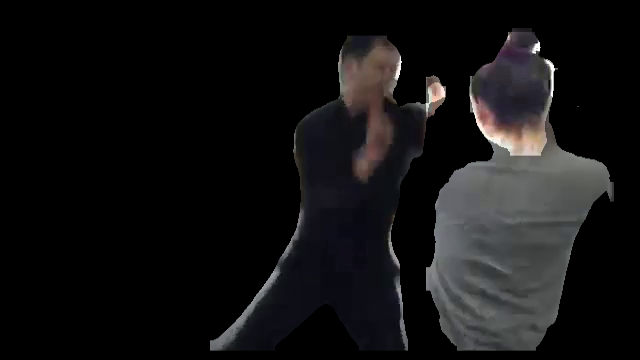


0: 384x640 2 persons, 12.2ms
Speed: 1.6ms preprocess, 12.2ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


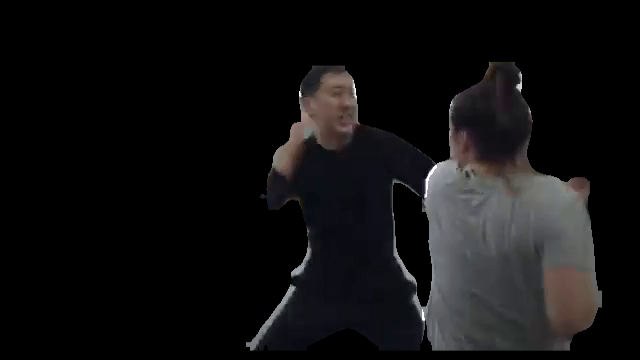


0: 384x640 3 persons, 13.3ms
Speed: 1.9ms preprocess, 13.3ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)


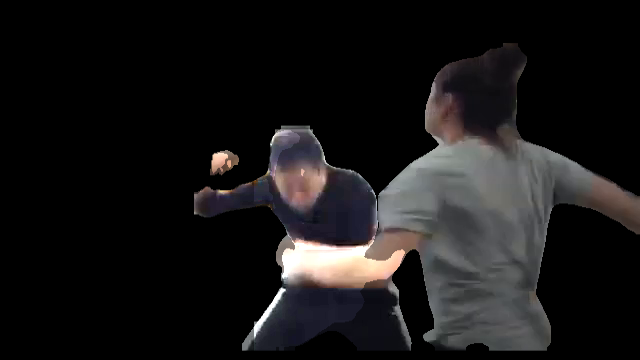


0: 384x640 3 persons, 1 chair, 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


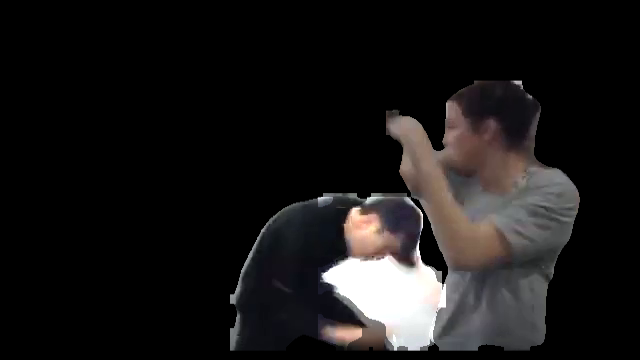


0: 384x640 2 persons, 1 tv, 11.0ms
Speed: 1.6ms preprocess, 11.0ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


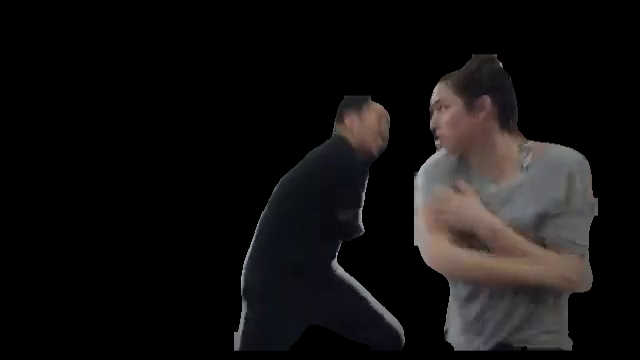


0: 384x640 4 persons, 1 tv, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


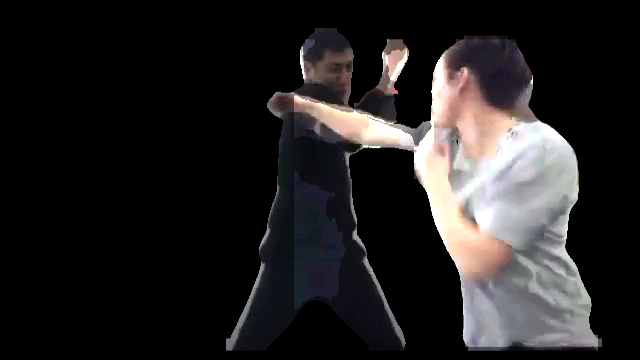


0: 384x640 2 persons, 1 chair, 10.4ms
Speed: 1.6ms preprocess, 10.4ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)


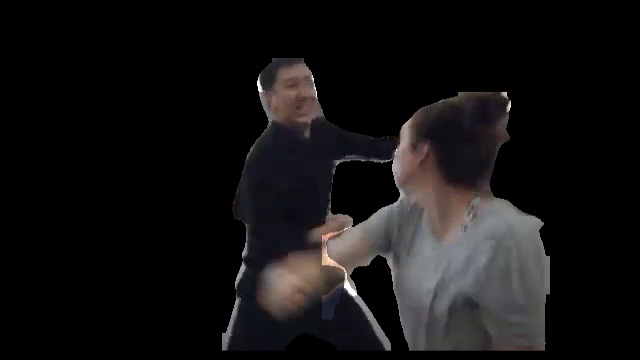


0: 384x640 2 persons, 1 bed, 12.5ms
Speed: 1.7ms preprocess, 12.5ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)


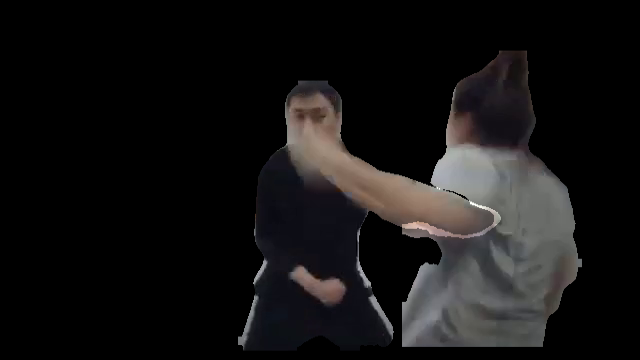


0: 384x640 2 persons, 10.8ms
Speed: 2.1ms preprocess, 10.8ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


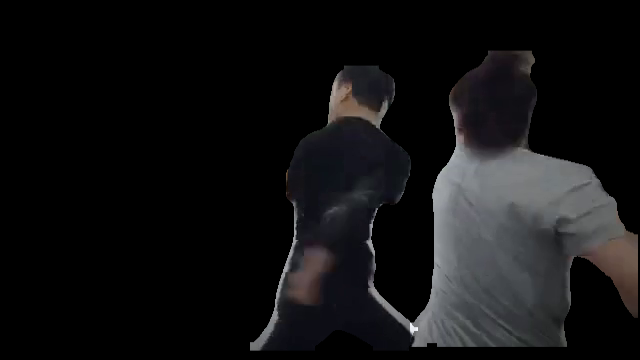


0: 384x640 2 persons, 1 bed, 10.3ms
Speed: 1.5ms preprocess, 10.3ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


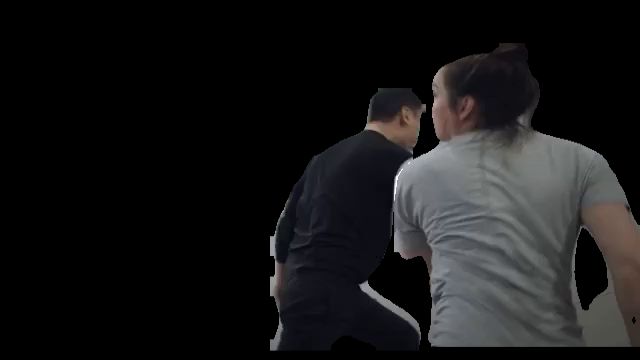


0: 384x640 1 person, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


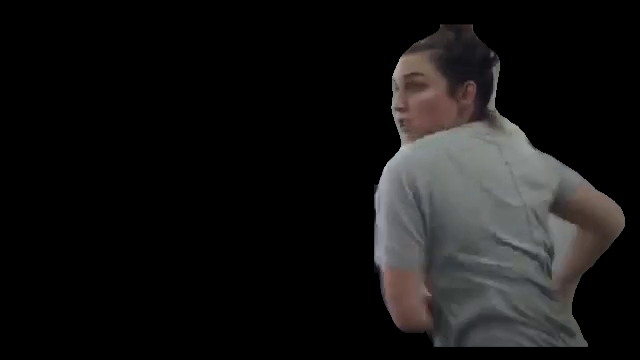


0: 384x640 2 persons, 10.6ms
Speed: 1.7ms preprocess, 10.6ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


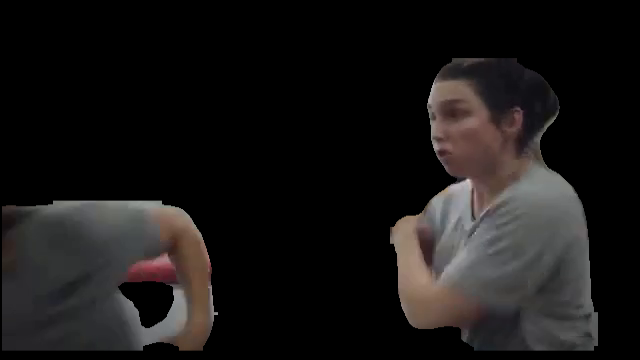


0: 384x640 2 persons, 2 books, 12.6ms
Speed: 1.5ms preprocess, 12.6ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


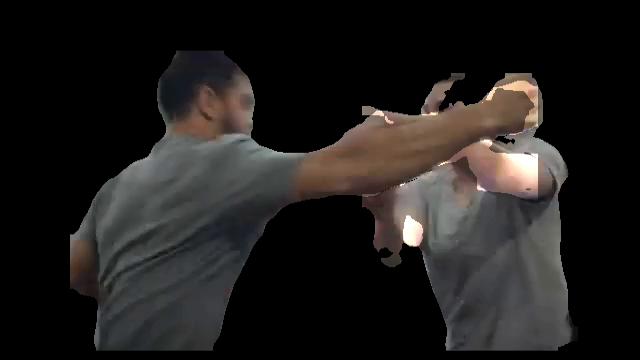


0: 384x640 2 persons, 11.9ms
Speed: 1.6ms preprocess, 11.9ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


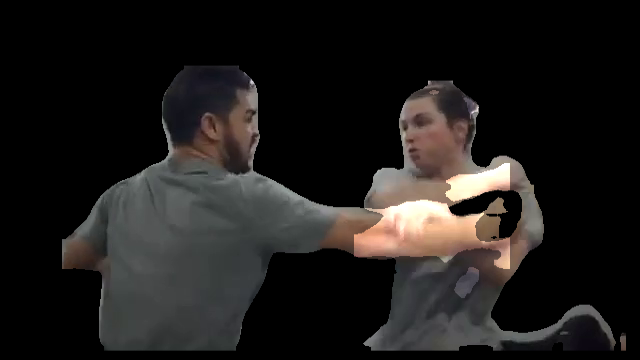


0: 384x640 3 persons, 10.5ms
Speed: 2.1ms preprocess, 10.5ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


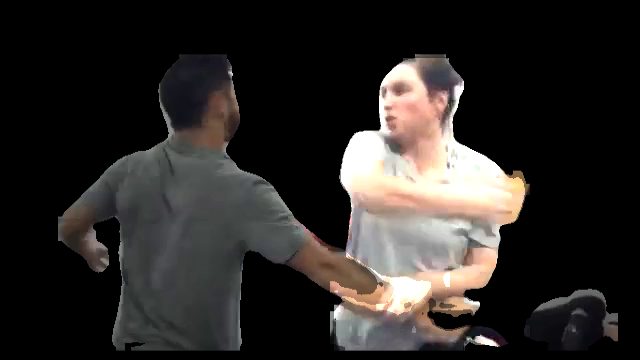


0: 384x640 2 persons, 10.5ms
Speed: 1.7ms preprocess, 10.5ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


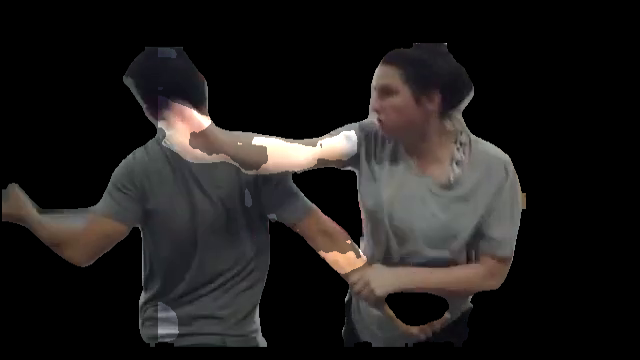


0: 384x640 2 persons, 1 dog, 10.4ms
Speed: 1.6ms preprocess, 10.4ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


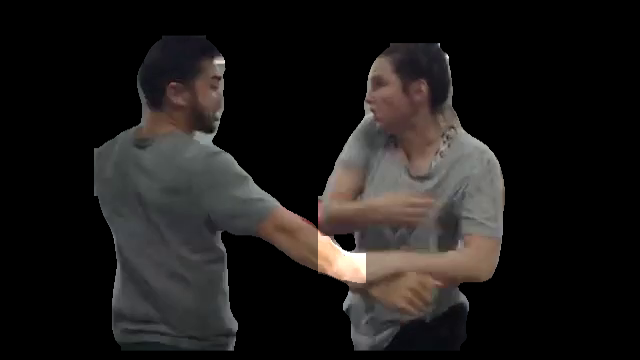


0: 384x640 2 persons, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 640)


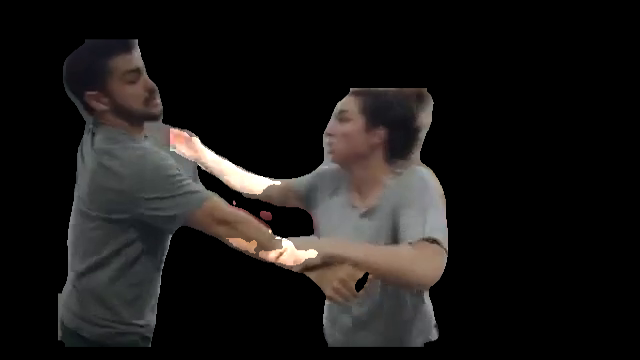


0: 384x640 3 persons, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


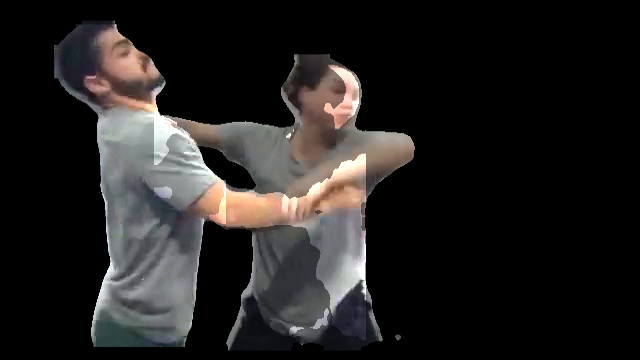


0: 384x640 3 persons, 12.2ms
Speed: 1.7ms preprocess, 12.2ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


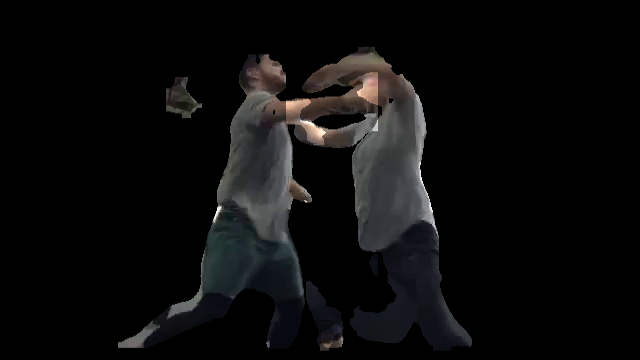


0: 384x640 5 persons, 10.1ms
Speed: 1.7ms preprocess, 10.1ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


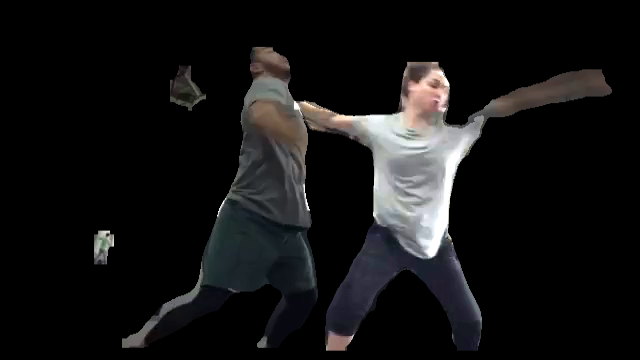


0: 384x640 3 persons, 11.7ms
Speed: 1.5ms preprocess, 11.7ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)


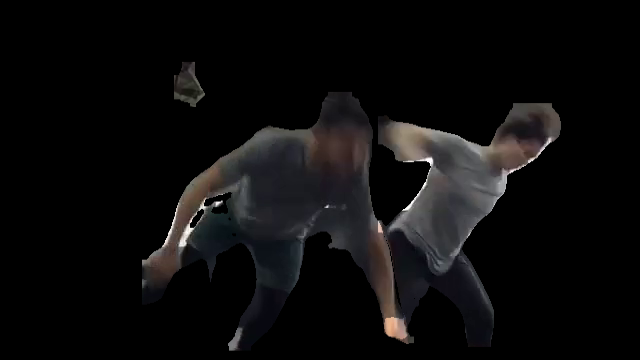


0: 384x640 3 persons, 12.8ms
Speed: 1.5ms preprocess, 12.8ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)


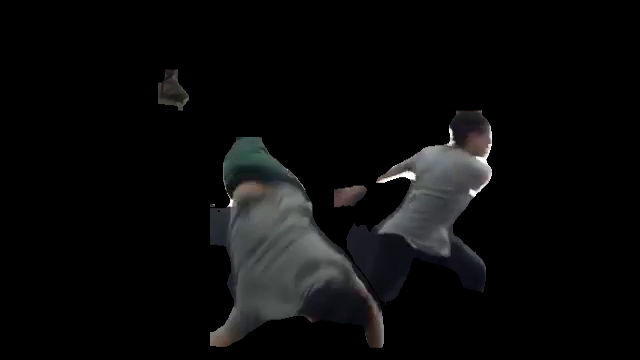


0: 384x640 2 persons, 1 suitcase, 11.6ms
Speed: 1.8ms preprocess, 11.6ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


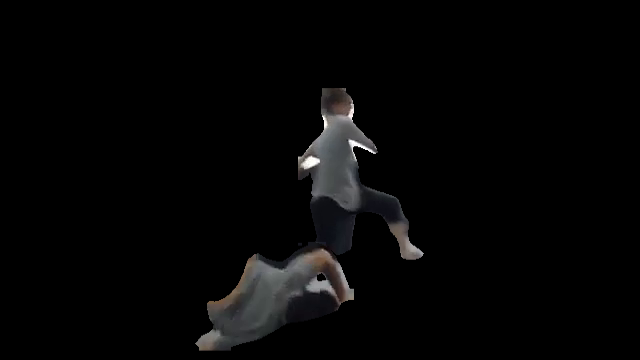


0: 384x640 2 persons, 10.1ms
Speed: 1.6ms preprocess, 10.1ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


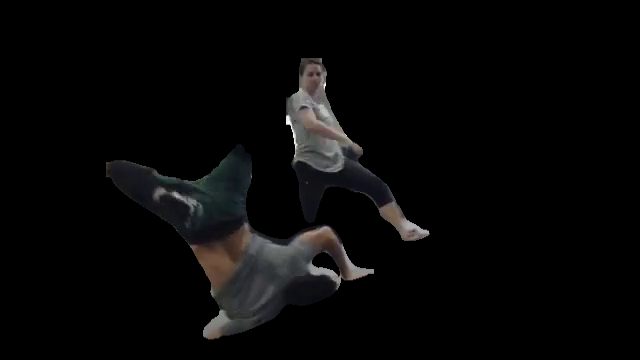


0: 384x640 2 persons, 11.0ms
Speed: 1.5ms preprocess, 11.0ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


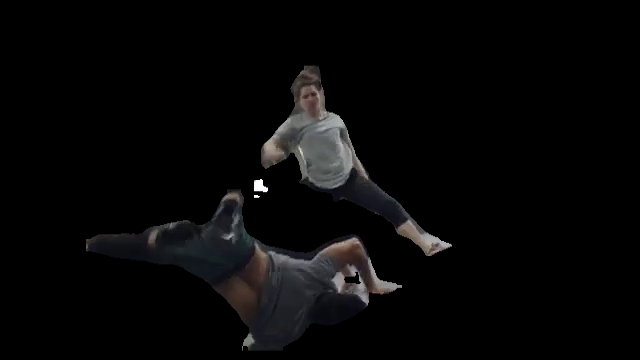


0: 384x640 3 persons, 10.5ms
Speed: 1.6ms preprocess, 10.5ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


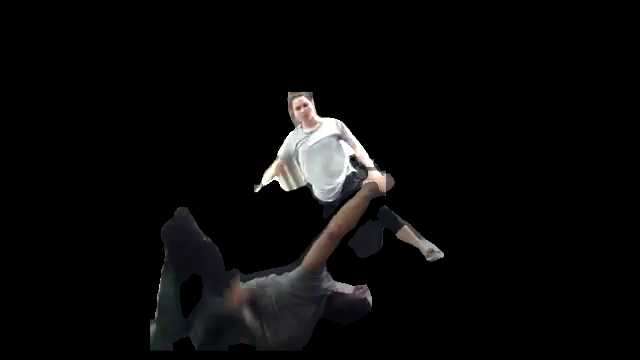


0: 384x640 2 persons, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


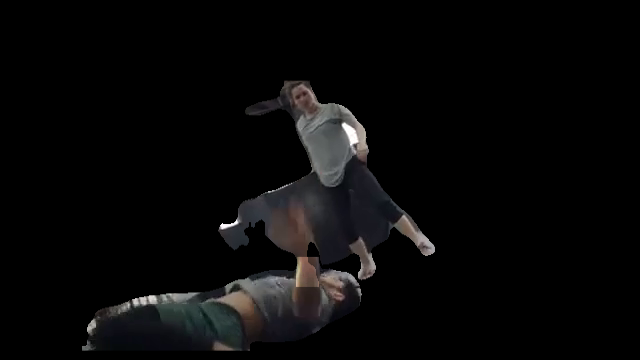


0: 384x640 2 persons, 10.8ms
Speed: 1.4ms preprocess, 10.8ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


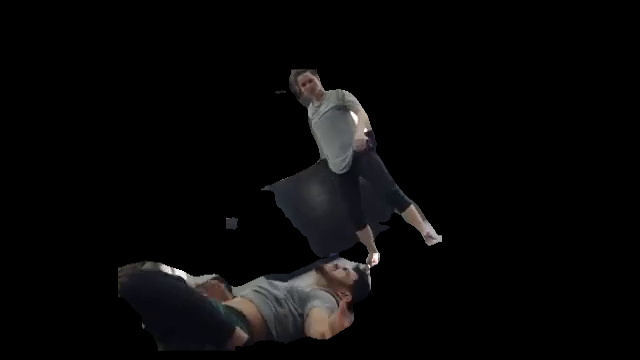


0: 384x640 2 persons, 10.6ms
Speed: 1.6ms preprocess, 10.6ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


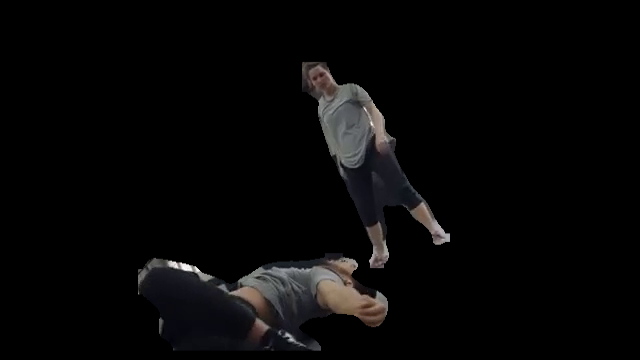


0: 384x640 2 persons, 22.0ms
Speed: 1.6ms preprocess, 22.0ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)


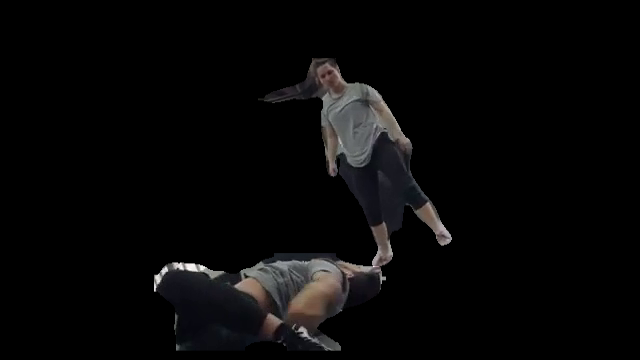


0: 384x640 2 persons, 12.6ms
Speed: 1.8ms preprocess, 12.6ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


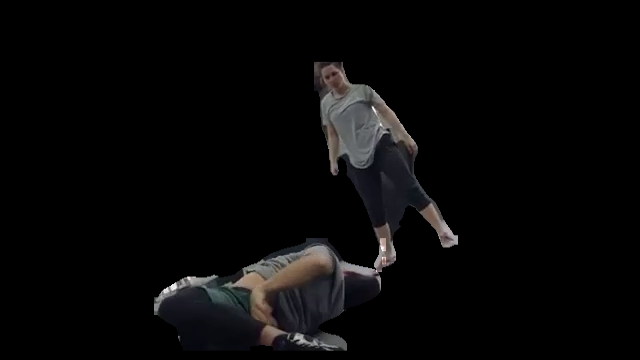


0: 384x640 2 persons, 15.2ms
Speed: 1.7ms preprocess, 15.2ms inference, 4.6ms postprocess per image at shape (1, 3, 384, 640)


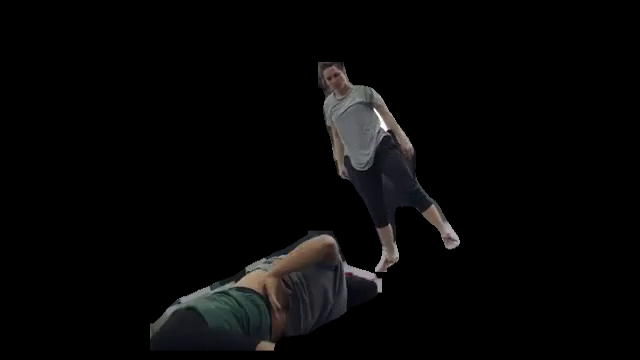


0: 384x640 2 persons, 1 skateboard, 12.5ms
Speed: 1.5ms preprocess, 12.5ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)


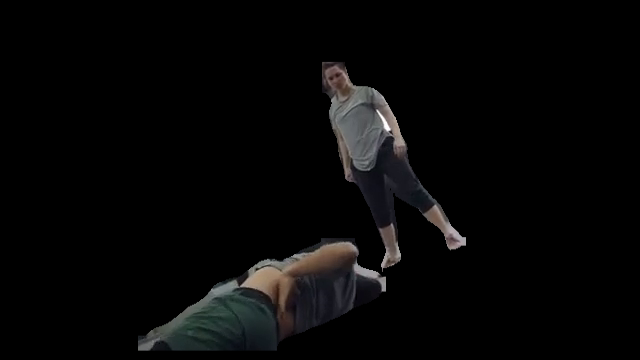


0: 384x640 1 person, 12.4ms
Speed: 1.6ms preprocess, 12.4ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


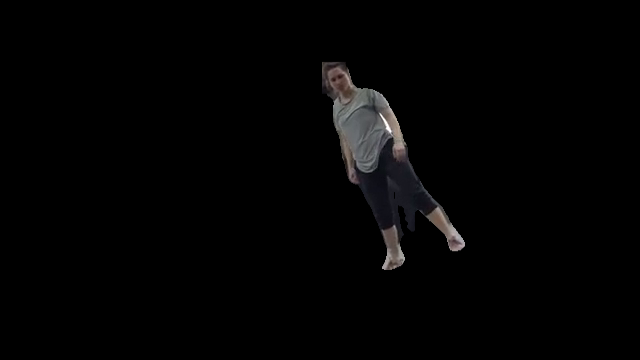


0: 384x640 2 persons, 10.8ms
Speed: 1.5ms preprocess, 10.8ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


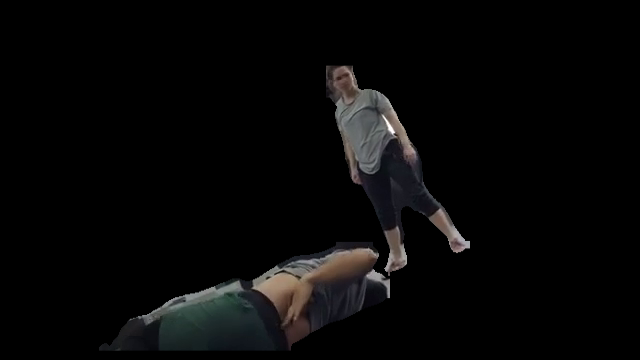


0: 384x640 3 persons, 14.4ms
Speed: 1.6ms preprocess, 14.4ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


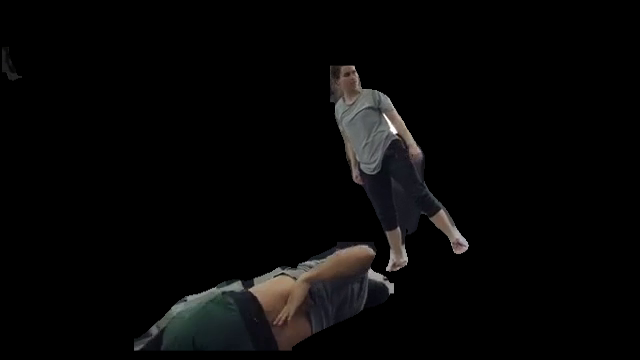


0: 384x640 1 person, 15.1ms
Speed: 1.5ms preprocess, 15.1ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


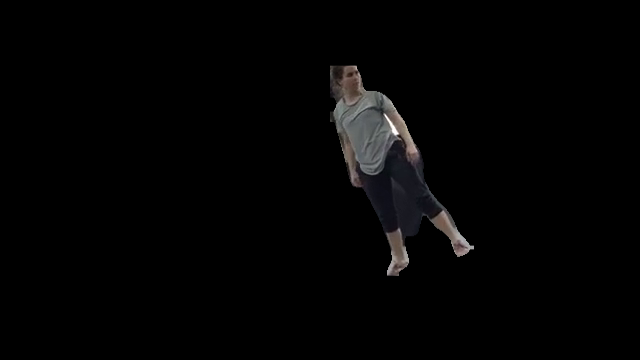

Video saved at /content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/segmented_output2.mp4
Person masks saved in /content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks2


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import os

# Load YOLOv8 segmentation model
model = YOLO('yolov8n-seg.pt')

# Create a directory to store the person masks
os.makedirs("/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks2", exist_ok=True)

# Function to segment video and save person masks
def segment_and_save_person_masks(input_video_path, output_video_path):
    cap = cv2.VideoCapture(input_video_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % 5 == 0:  # Skip frames
            # Initialize a blank mask image for this frame
            mask_image = np.zeros_like(frame, dtype=np.float32)

            results = model(frame)

            if results[0].masks is not None and results[0].boxes is not None:
                masks = results[0].masks
                boxes = results[0].boxes

                for i, (mask, box) in enumerate(zip(masks.data, boxes)):
                    label = results[0].names[int(box.cls)]
                    if label == 'person':
                        mask_resized = cv2.resize(mask.cpu().numpy(), (frame.shape[1], frame.shape[0]))
                        person_segmented = np.multiply(frame, mask_resized[..., np.newaxis])
                        mask_image += person_segmented
                        os.makedirs(f"/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks2/mask_person_{i}", exist_ok=True)
                        cv2.imwrite(f"/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks2/mask_person_{i}/frame_{frame_count}_person_{i}.png", person_segmented)

                mask_image = np.clip(mask_image, 0, 255).astype(np.uint8)
                out.write(mask_image)
                cv2_imshow(mask_image)  # Display the processed frame for debugging

            else:
                print(f"No masks detected in frame {frame_count}")

        frame_count += 1

    cap.release()
    out.release()
    print(f"Video saved at {output_video_path}")
    print(f"Person masks saved in /content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks2")

# Set input and output video paths
input_video = '/content/drive/MyDrive/Colab Notebooks/video1.mp4'
output_video = '/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/segmented_output2.mp4'

# Perform segmentation and save person masks
segment_and_save_person_masks(input_video, output_video)

# **Improved Code: Skip Frames & Person ReID**

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import os
import torchreid

model = YOLO('yolov8n-seg.pt')

# Load the ReID model (modify the model name as necessary)
reid_model = torchreid.models.build_model(
    name='resnet50',  # Change to your desired model
    num_classes=,  # Adjust based on your dataset
    loss='softmax',
)
reid_model.load_weights('path_to_weights.pth')  # Load pre-trained weights

# Create a directory to store the person masks
os.makedirs("/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks", exist_ok=True)

# Function to segment video and save person masks
def segment_and_save_person_masks(input_video_path, output_video_path):
    # Open the video file
    cap = cv2.VideoCapture(input_video_path)

    # Get video properties
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # Define video writer to save the segmented output video
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    # ReID tracking
    person_tracks = {}  # Dictionary to hold tracking information
    next_id = 0  # Next available ID for a new person

    frame_count = 0  # Frame counter
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % 5 == 0:  # Process every 5th frame
            # Initialize a blank mask image for this frame
            mask_image = np.zeros_like(frame, dtype=np.float32)  # Use float32 for mask image

            # Perform segmentation using YOLOv8
            results = model(frame)

            # Check if masks and boxes are present in the results
            if results[0].masks is not None and results[0].boxes is not None:
                masks = results[0].masks  # Segmentation masks
                boxes = results[0].boxes  # Bounding boxes

                # Loop through all detections
                for i, (mask, box) in enumerate(zip(masks.data, boxes)):
                    label = results[0].names[int(box.cls)]  # Get the label of the detected object

                    # Check if the object is a person
                    if label == 'person':
                        # Resize mask to the frame size
                        mask_resized = cv2.resize(mask.cpu().numpy(), (frame.shape[1], frame.shape[0]))

                        # Convert mask to binary and multiply with the original frame to extract the person
                        person_segmented = np.multiply(frame, mask_resized[..., np.newaxis])

                        # Extract features for ReID
                        features = reid_model(person_segmented)  # Assuming you have a way to extract features

                        # Match or assign new ID based on features (simplified logic)
                        matched_id = None
                        for track_id, track_features in person_tracks.items():
                            if np.all(np.isclose(features, track_features, atol=1e-3)):  # Simple feature matching
                                matched_id = track_id
                                break

                        if matched_id is None:  # If no match found, create a new track
                            matched_id = next_id
                            person_tracks[matched_id] = features
                            next_id += 1

                        # Add this mask to the mask_image for all persons
                        mask_image += person_segmented

                        # Save each person's segmented mask as an image in their respective directory
                        person_mask_dir = f"/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks/person_{matched_id}"
                        os.makedirs(person_mask_dir, exist_ok=True)
                        cv2.imwrite(f"{person_mask_dir}/frame_{frame_count}_person_{matched_id}.png", person_segmented)

                # Clip values to valid range [0, 255] and convert to uint8 for saving
                mask_image = np.clip(mask_image, 0, 255).astype(np.uint8)

                # Write the annotated frame (with all masks) to the output video
                out.write(mask_image)

            else:
                print(f"No masks detected in frame {frame_count}")

        frame_count += 1
        print(f"Processed frame {frame_count}")

    # Release everything when done
    cap.release()
    out.release()
    print(f"Video saved at {output_video_path}")
    print(f"Person masks saved in /content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/person_masks")

# Step 3: Set input and output video paths
input_video = '/content/drive/MyDrive/Colab Notebooks/video1.mp4'  # Change this to your video path
output_video = '/content/drive/MyDrive/Colab Notebooks/Segmentation_Outputs/segmented_output.mp4'  # Path to save segmented video

# Perform segmentation and save person masks
segment_and_save_person_masks(input_video, output_video)


# **Mask Free Segmentation - facebook**

In [ ]:
# Clone the MaskFreeVIS repository
!git clone https://github.com/SysCV/MaskFreeVIS.git

fatal: destination path 'MaskFreeVIS' already exists and is not an empty directory.


In [ ]:
!pip install gdown  # Ensure gdown is installed
!gdown 'https://drive.google.com/uc?id=1kvckNoaDftN5R16CRJ-izfHeKTl_rskt' -O //content/drive/MyDrive/Colab Notebooks/MaskFreeVIS/segment_model.pth

usage: gdown [-h] [-V] [-O OUTPUT] [-q] [--fuzzy] [--id] [--proxy PROXY] [--speed SPEED]
             [--no-cookies] [--no-check-certificate] [--continue] [--folder] [--remaining-ok]
             [--format FORMAT] [--user-agent USER_AGENT]
             url_or_id
gdown: error: unrecognized arguments: Notebooks/MaskFreeVIS/segment_model.pth


In [ ]:
# Add the MaskFreeVIS directory to the Python path
import sys
sys.path.append('/content/MaskFreeVIS')

# Import necessary libraries
import torch
import cv2
import os
import numpy as np
from mask2former_video.video_maskformer_model import Maskformer  # Importing the model from the specified path

# Load the pretrained model
model = Maskformer()  # Adjust initialization based on the actual constructor
model.load_state_dict(torch.load('/content/MaskFreeVIS/segment_model.pth'))  # Load your model
model.eval()

# Function to segment video frames
def segment_video(video_path):
    cap = cv2.VideoCapture(video_path)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    output_dir = "/content/SegmentedFrames"
    os.makedirs(output_dir, exist_ok=True)

    for i in range(frame_count):
        ret, frame = cap.read()
        if not ret:
            break

        # Preprocess the frame (assuming model input requires resizing)
        input_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        input_frame = cv2.resize(input_frame, (640, 640))  # Adjust size based on model requirement
        input_frame = torch.from_numpy(input_frame).permute(2, 0, 1).float().unsqueeze(0) / 255.0  # Normalize

        # Segment the frame
        with torch.no_grad():
            output_mask = model(input_frame)  # Run the model (adjust as necessary)

        # Assuming the output mask is binary; you might need to adjust based on the model output
        output_mask = (output_mask.squeeze(0).cpu().numpy() > 0.5).astype(np.uint8)  # Binarize

        # Apply mask to frame and save
        segmented_frame = output_mask * frame
        cv2.imwrite(os.path.join(output_dir, f"segmented_frame_{i:04d}.png"), segmented_frame)

    cap.release()
    print(f"Segmented frames saved to {output_dir}")

# Specify your video path
video_path = '/content/your_video.mp4'  # Update this to your video path
segment_video(video_path)


In [ ]:
!pwd

/content/drive/MyDrive/Colab Notebooks


In [ ]:
!ls

'3D CNN.ipynb'
'Copy of Detectron2 Tutorial.ipynb'
'HIT Model.ipynb'
 IE643_24M2119_Assigment-1_Q3.ipynb
 IE643_Feed_Forward_Net_Demo_Autumn2024_HW.ipynb
 MaskFreeVIS
 outputs
 outputs1
 outputs7
 segmented_output1.mp4
 segmented_output.mp4
'Segment Video.ipynb'
'Task-1: Data Pre-processing on UCF Crime Dataset.ipynb'
 video1.mp4
 video.mp4
 yolov8n-seg.pt
